# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [7]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [8]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

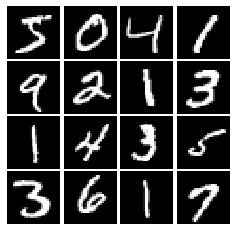

In [9]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [10]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return tf.where(x<0, alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [11]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [12]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [13]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [14]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

            tf.keras.layers.Dense(256, activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
            tf.keras.layers.Dense(256, activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
            tf.keras.layers.Dense(1, activation=None)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ])
    
#     model = tf.keras.models.Sequential([
#         tf.keras.layers.Dense(256, activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
#         tf.keras.layers.Dense(256, activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
#         tf.keras.layers.Dense(1, activation=None)])

    return model

Test to make sure the number of parameters in the discriminator is correct:

In [15]:
def test_discriminator(true_count=267009):
    model = discriminator()
    model(tf.ones([1, 784]))
    model.summary()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                multiple                  200960    
_________________________________________________________________
dense_1 (Dense)              multiple                  65792     
_________________________________________________________________
dense_2 (Dense)              multiple                  257       
Total params: 267,009
Trainable params: 267,009
Non-trainable params: 0
_________________________________________________________________
Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [16]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

            tf.keras.layers.Dense(1024, activation='relu'),
            tf.keras.layers.Dense(1024, activation='relu'),
            tf.keras.layers.Dense(784, activation='tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [17]:
def test_generator(true_count=1858320):
    model = generator(4)
    model(tf.ones([1, 4]))
    
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [18]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss =bce(tf.ones(tf.shape(logits_real)), logits_real) + bce(tf.zeros(tf.shape(logits_fake)), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones(tf.shape(logits_fake)), logits_fake)
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [19]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [20]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [21]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [22]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 2.099, G:0.6461


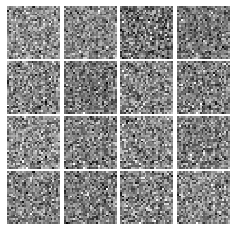

Epoch: 0, Iter: 20, D: 0.6014, G:0.9154


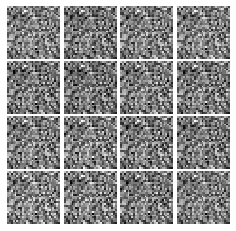

Epoch: 0, Iter: 40, D: 0.6013, G:0.9863


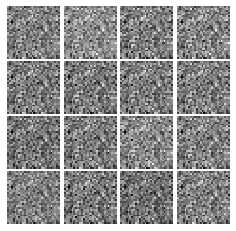

Epoch: 0, Iter: 60, D: 0.3796, G:2.541


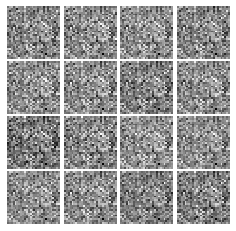

Epoch: 0, Iter: 80, D: 2.504, G:0.4799


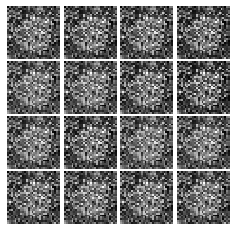

Epoch: 0, Iter: 100, D: 0.9883, G:1.512


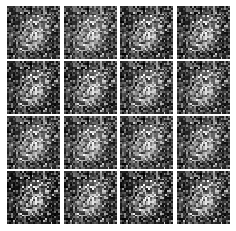

Epoch: 0, Iter: 120, D: 1.412, G:0.7183


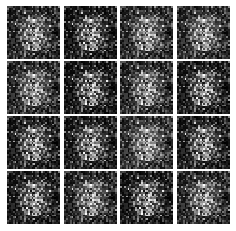

Epoch: 0, Iter: 140, D: 1.469, G:0.9167


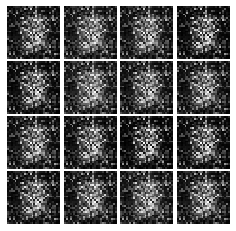

Epoch: 0, Iter: 160, D: 1.357, G:0.7003


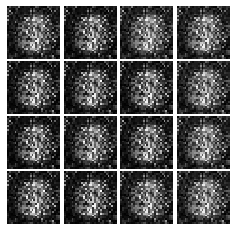

Epoch: 0, Iter: 180, D: 1.503, G:1.096


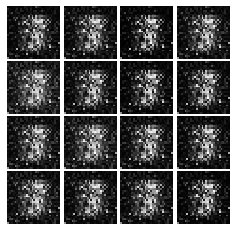

Epoch: 0, Iter: 200, D: 1.739, G:0.8808


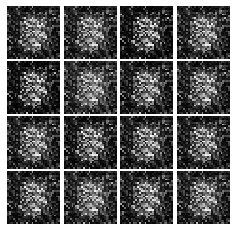

Epoch: 0, Iter: 220, D: 1.201, G:1.105


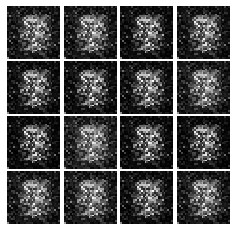

Epoch: 0, Iter: 240, D: 1.192, G:1.058


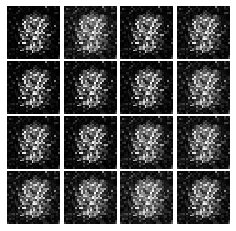

Epoch: 0, Iter: 260, D: 1.471, G:0.6569


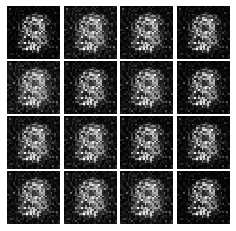

Epoch: 0, Iter: 280, D: 1.326, G:0.9447


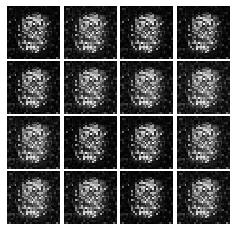

Epoch: 0, Iter: 300, D: 1.868, G:0.7936


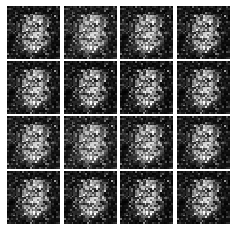

Epoch: 0, Iter: 320, D: 1.575, G:0.6116


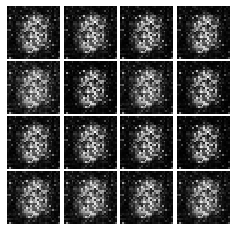

Epoch: 0, Iter: 340, D: 2.09, G:0.853


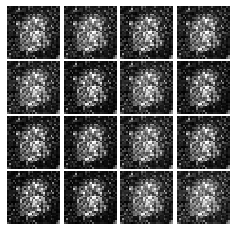

Epoch: 0, Iter: 360, D: 0.873, G:1.402


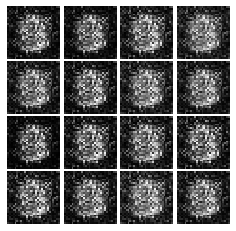

Epoch: 0, Iter: 380, D: 0.9528, G:1.787


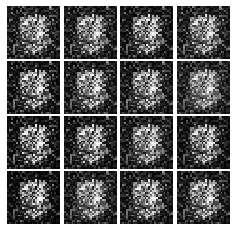

Epoch: 0, Iter: 400, D: 2.346, G:0.7031


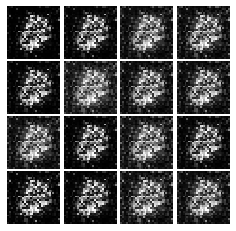

Epoch: 0, Iter: 420, D: 1.013, G:1.624


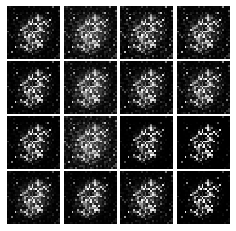

Epoch: 0, Iter: 440, D: 0.8261, G:1.75


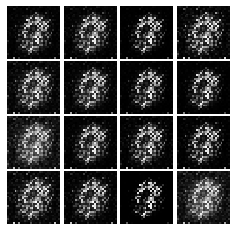

Epoch: 0, Iter: 460, D: 0.8359, G:1.862


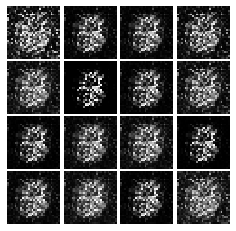

Epoch: 1, Iter: 480, D: 1.124, G:0.977


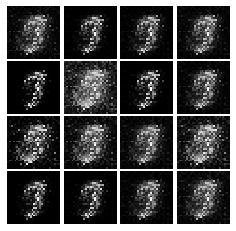

Epoch: 1, Iter: 500, D: 1.413, G:1.381


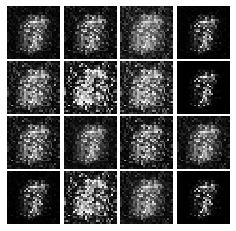

Epoch: 1, Iter: 520, D: 1.014, G:1.644


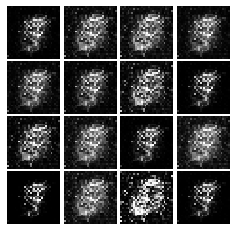

Epoch: 1, Iter: 540, D: 1.167, G:0.5592


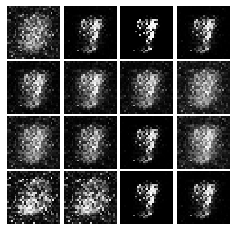

Epoch: 1, Iter: 560, D: 1.274, G:1.699


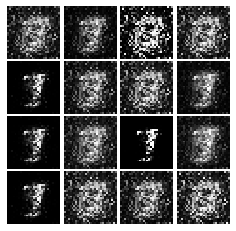

Epoch: 1, Iter: 580, D: 1.044, G:1.542


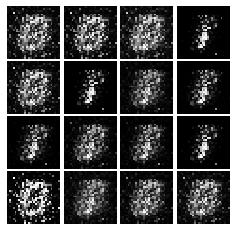

Epoch: 1, Iter: 600, D: 1.148, G:1.727


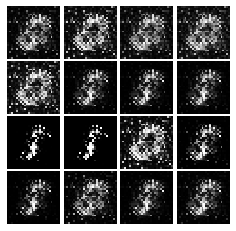

Epoch: 1, Iter: 620, D: 1.283, G:1.523


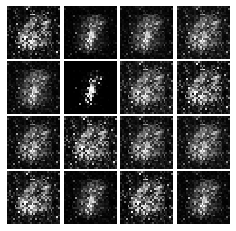

Epoch: 1, Iter: 640, D: 1.582, G:1.091


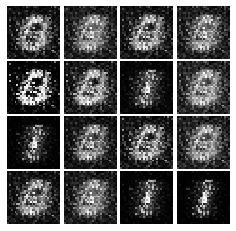

Epoch: 1, Iter: 660, D: 0.9755, G:2.116


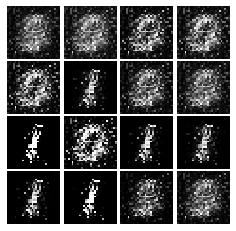

Epoch: 1, Iter: 680, D: 1.138, G:2.586


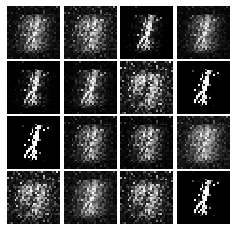

Epoch: 1, Iter: 700, D: 0.9945, G:1.36


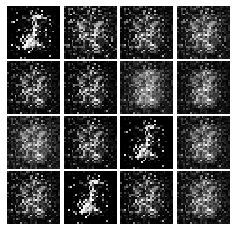

Epoch: 1, Iter: 720, D: 1.134, G:1.714


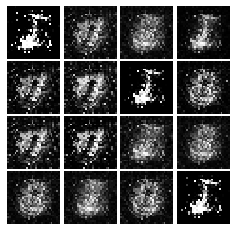

Epoch: 1, Iter: 740, D: 1.527, G:1.438


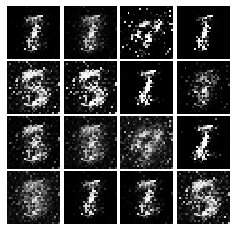

Epoch: 1, Iter: 760, D: 0.9768, G:1.374


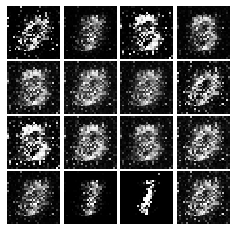

Epoch: 1, Iter: 780, D: 1.325, G:1.285


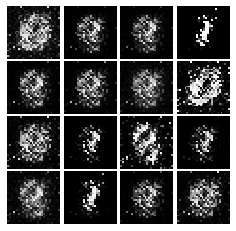

Epoch: 1, Iter: 800, D: 1.234, G:1.183


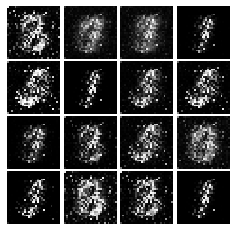

Epoch: 1, Iter: 820, D: 1.123, G:1.608


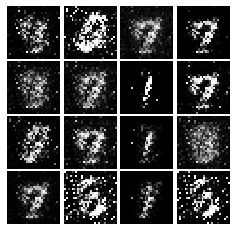

Epoch: 1, Iter: 840, D: 1.035, G:1.663


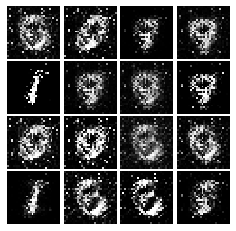

Epoch: 1, Iter: 860, D: 1.19, G:0.9461


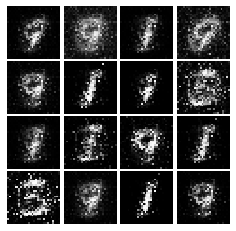

Epoch: 1, Iter: 880, D: 1.209, G:0.9929


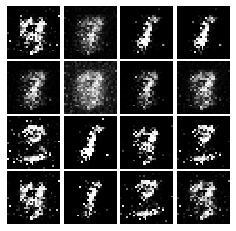

Epoch: 1, Iter: 900, D: 1.116, G:1.005


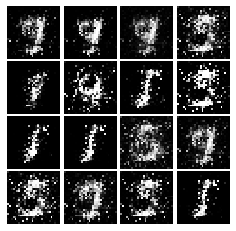

Epoch: 1, Iter: 920, D: 1.325, G:1.651


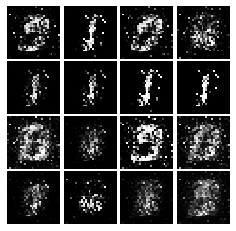

Epoch: 2, Iter: 940, D: 1.47, G:1.661


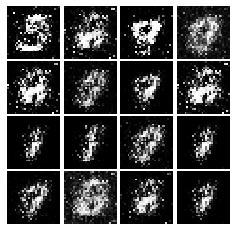

Epoch: 2, Iter: 960, D: 1.118, G:1.294


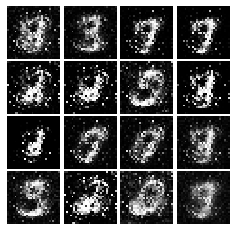

Epoch: 2, Iter: 980, D: 1.429, G:2.108


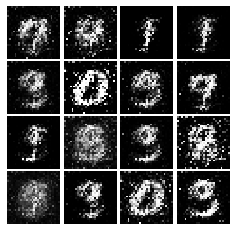

Epoch: 2, Iter: 1000, D: 1.688, G:1.255


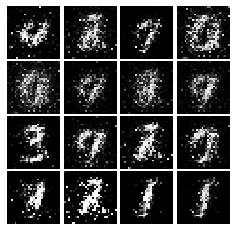

Epoch: 2, Iter: 1020, D: 1.063, G:1.203


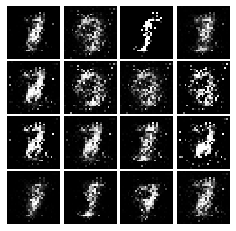

Epoch: 2, Iter: 1040, D: 1.019, G:0.8604


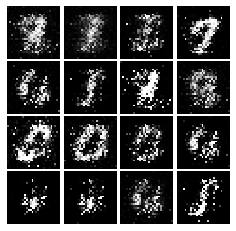

Epoch: 2, Iter: 1060, D: 1.134, G:3.362


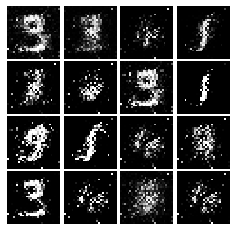

Epoch: 2, Iter: 1080, D: 1.157, G:2.015


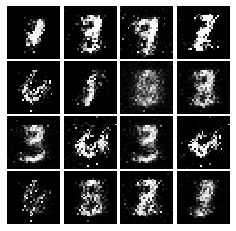

Epoch: 2, Iter: 1100, D: 1.213, G:1.12


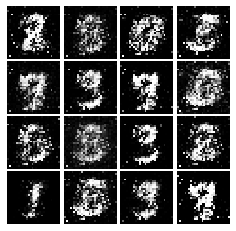

Epoch: 2, Iter: 1120, D: 1.748, G:0.3702


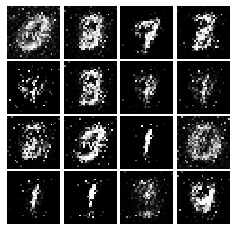

Epoch: 2, Iter: 1140, D: 1.436, G:0.9886


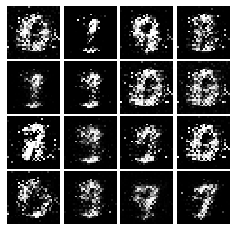

Epoch: 2, Iter: 1160, D: 1.233, G:1.106


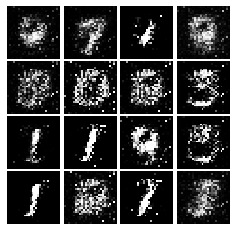

Epoch: 2, Iter: 1180, D: 1.499, G:0.9316


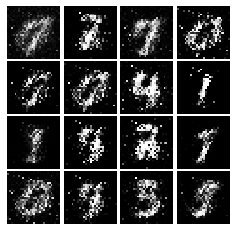

Epoch: 2, Iter: 1200, D: 1.277, G:0.8172


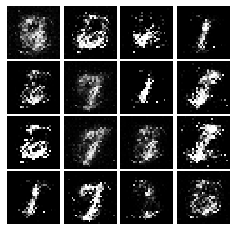

Epoch: 2, Iter: 1220, D: 1.093, G:1.809


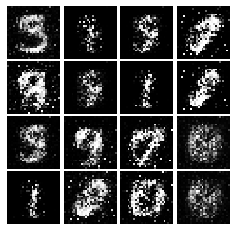

Epoch: 2, Iter: 1240, D: 1.222, G:1.622


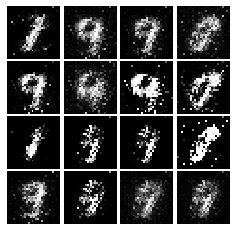

Epoch: 2, Iter: 1260, D: 1.637, G:0.5493


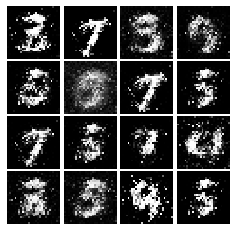

Epoch: 2, Iter: 1280, D: 1.045, G:1.8


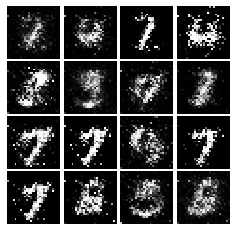

Epoch: 2, Iter: 1300, D: 1.26, G:1.221


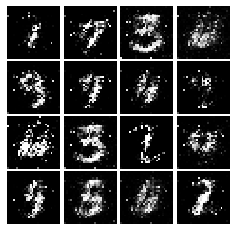

Epoch: 2, Iter: 1320, D: 1.431, G:1.102


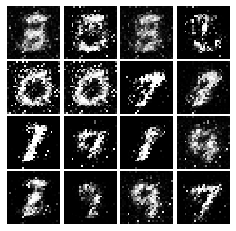

Epoch: 2, Iter: 1340, D: 1.129, G:1.501


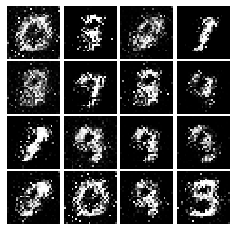

Epoch: 2, Iter: 1360, D: 1.186, G:0.9145


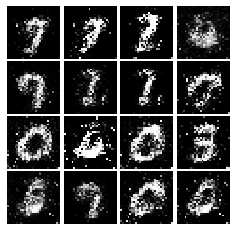

Epoch: 2, Iter: 1380, D: 1.14, G:1.122


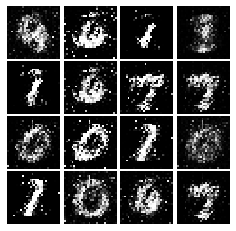

Epoch: 2, Iter: 1400, D: 1.17, G:0.955


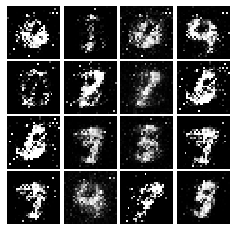

Epoch: 3, Iter: 1420, D: 1.266, G:0.86


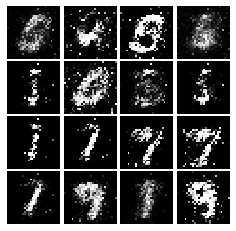

Epoch: 3, Iter: 1440, D: 1.291, G:0.8956


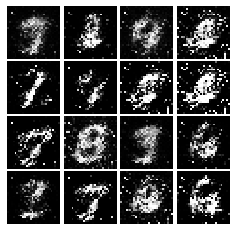

Epoch: 3, Iter: 1460, D: 1.206, G:1.108


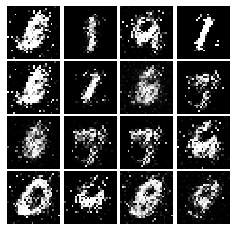

Epoch: 3, Iter: 1480, D: 1.23, G:0.9858


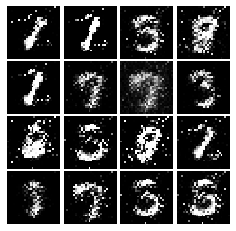

Epoch: 3, Iter: 1500, D: 1.309, G:0.9133


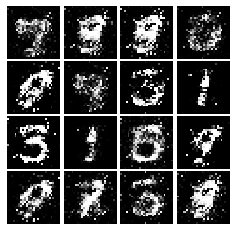

Epoch: 3, Iter: 1520, D: 1.398, G:1.216


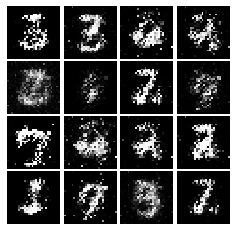

Epoch: 3, Iter: 1540, D: 1.26, G:1.013


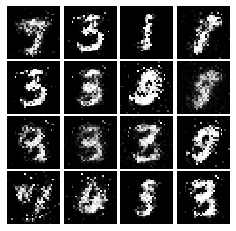

Epoch: 3, Iter: 1560, D: 1.216, G:0.9972


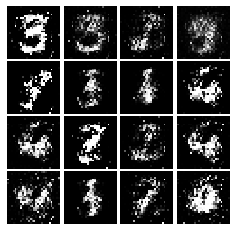

Epoch: 3, Iter: 1580, D: 1.157, G:0.9421


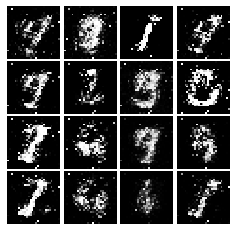

Epoch: 3, Iter: 1600, D: 1.251, G:0.9918


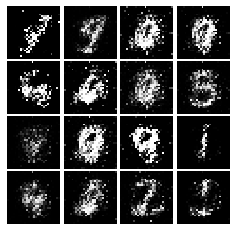

Epoch: 3, Iter: 1620, D: 1.326, G:1.773


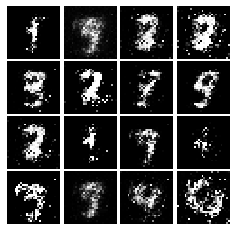

Epoch: 3, Iter: 1640, D: 1.362, G:0.8989


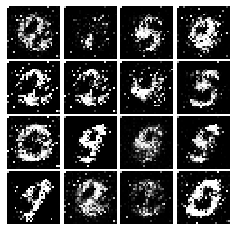

Epoch: 3, Iter: 1660, D: 1.117, G:1.22


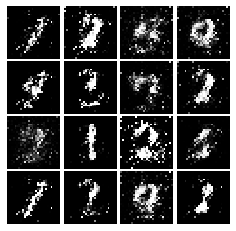

Epoch: 3, Iter: 1680, D: 1.114, G:1.044


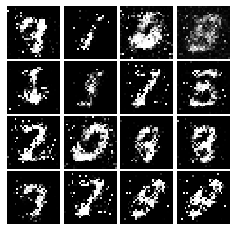

Epoch: 3, Iter: 1700, D: 1.216, G:0.9264


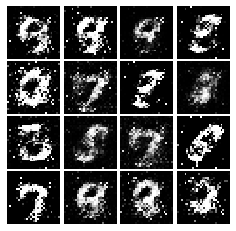

Epoch: 3, Iter: 1720, D: 1.205, G:1.066


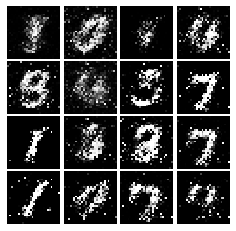

Epoch: 3, Iter: 1740, D: 1.252, G:0.889


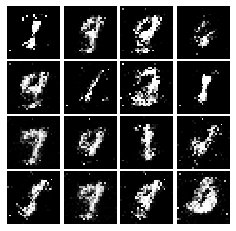

Epoch: 3, Iter: 1760, D: 1.22, G:0.9636


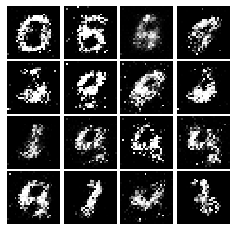

Epoch: 3, Iter: 1780, D: 1.175, G:1.028


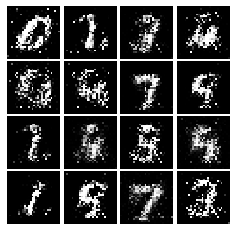

Epoch: 3, Iter: 1800, D: 1.262, G:0.8516


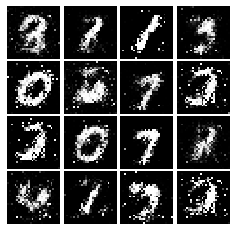

Epoch: 3, Iter: 1820, D: 1.262, G:0.9703


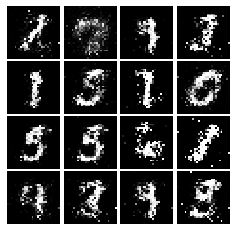

Epoch: 3, Iter: 1840, D: 1.348, G:0.8392


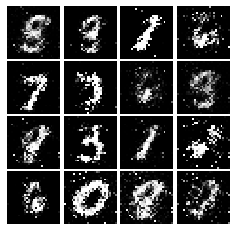

Epoch: 3, Iter: 1860, D: 1.203, G:0.8988


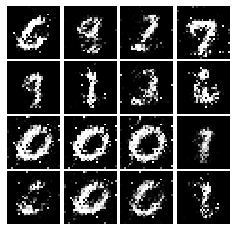

Epoch: 4, Iter: 1880, D: 1.317, G:0.9796


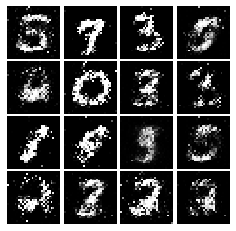

Epoch: 4, Iter: 1900, D: 1.29, G:0.7973


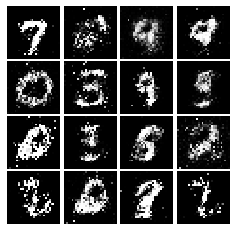

Epoch: 4, Iter: 1920, D: 1.322, G:0.835


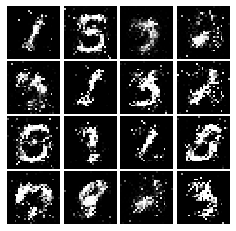

Epoch: 4, Iter: 1940, D: 1.096, G:1.388


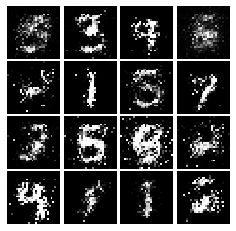

Epoch: 4, Iter: 1960, D: 1.146, G:0.8324


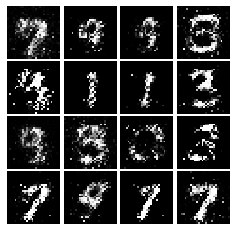

Epoch: 4, Iter: 1980, D: 1.17, G:1.908


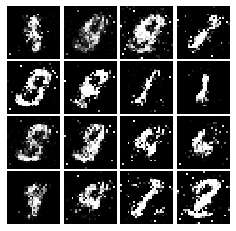

Epoch: 4, Iter: 2000, D: 1.272, G:0.9262


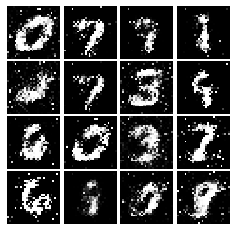

Epoch: 4, Iter: 2020, D: 1.324, G:0.799


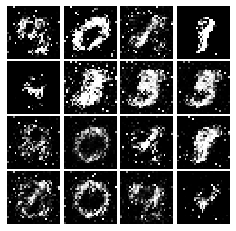

Epoch: 4, Iter: 2040, D: 1.298, G:0.8909


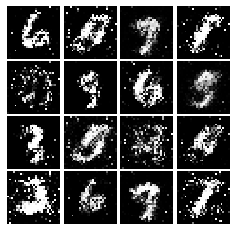

Epoch: 4, Iter: 2060, D: 1.367, G:0.859


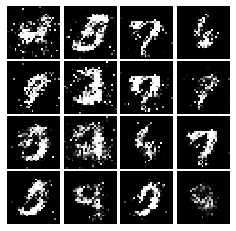

Epoch: 4, Iter: 2080, D: 1.261, G:0.845


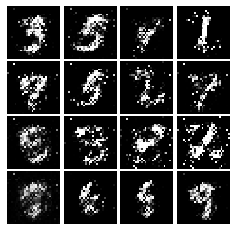

Epoch: 4, Iter: 2100, D: 1.218, G:0.8714


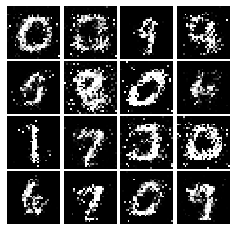

Epoch: 4, Iter: 2120, D: 1.384, G:0.9414


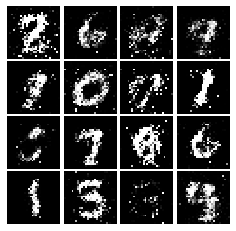

Epoch: 4, Iter: 2140, D: 1.305, G:0.8329


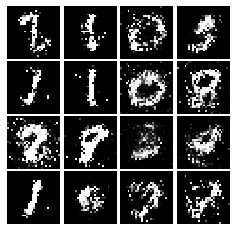

Epoch: 4, Iter: 2160, D: 1.318, G:0.7982


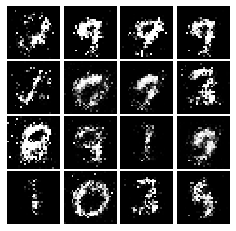

Epoch: 4, Iter: 2180, D: 1.191, G:1.165


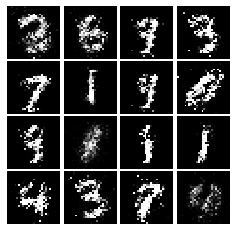

Epoch: 4, Iter: 2200, D: 1.202, G:0.923


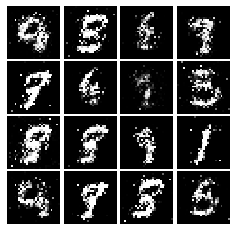

Epoch: 4, Iter: 2220, D: 1.219, G:1.175


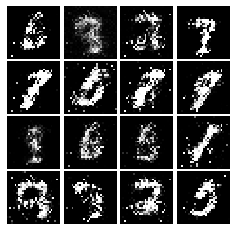

Epoch: 4, Iter: 2240, D: 1.216, G:0.9811


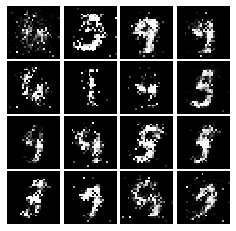

Epoch: 4, Iter: 2260, D: 1.198, G:0.8624


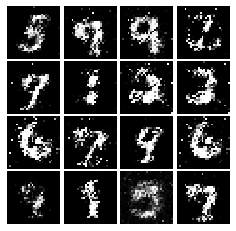

Epoch: 4, Iter: 2280, D: 1.184, G:0.9857


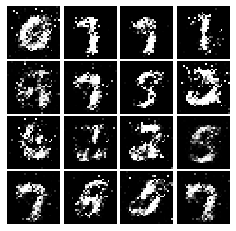

Epoch: 4, Iter: 2300, D: 1.35, G:0.8637


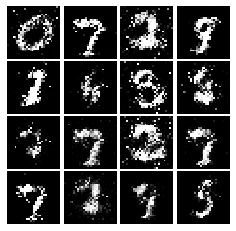

Epoch: 4, Iter: 2320, D: 1.321, G:0.8758


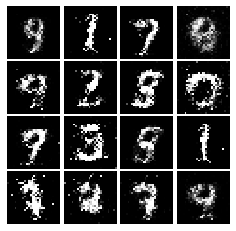

Epoch: 4, Iter: 2340, D: 1.379, G:0.7309


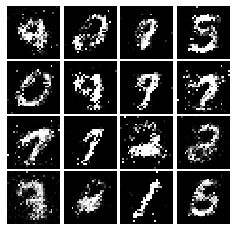

Epoch: 5, Iter: 2360, D: 1.341, G:0.8759


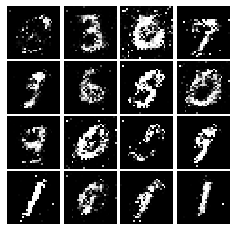

Epoch: 5, Iter: 2380, D: 1.336, G:0.7796


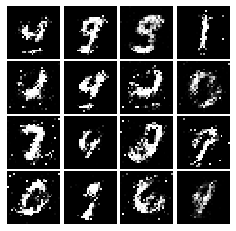

Epoch: 5, Iter: 2400, D: 1.356, G:0.856


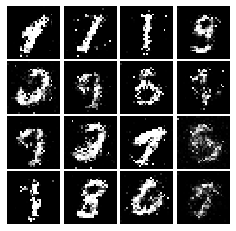

Epoch: 5, Iter: 2420, D: 1.465, G:0.8745


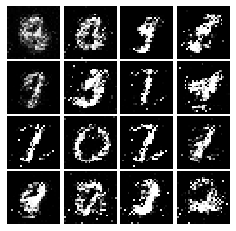

Epoch: 5, Iter: 2440, D: 1.258, G:0.8592


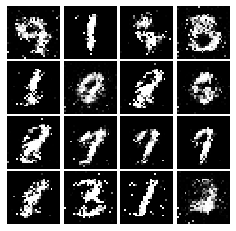

Epoch: 5, Iter: 2460, D: 1.188, G:1.268


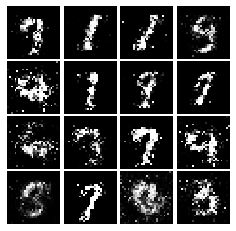

Epoch: 5, Iter: 2480, D: 1.268, G:0.7728


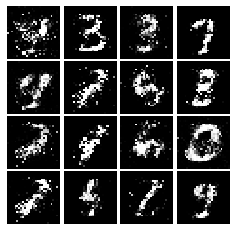

Epoch: 5, Iter: 2500, D: 1.257, G:0.7787


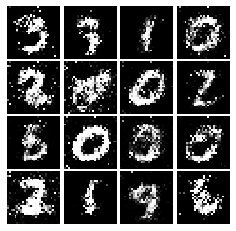

Epoch: 5, Iter: 2520, D: 1.471, G:0.7858


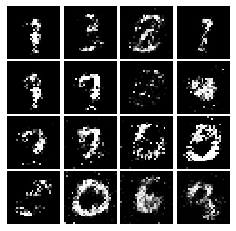

Epoch: 5, Iter: 2540, D: 1.313, G:0.8337


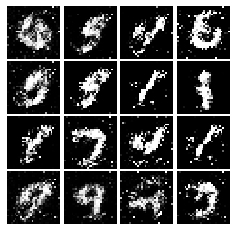

Epoch: 5, Iter: 2560, D: 1.337, G:0.8375


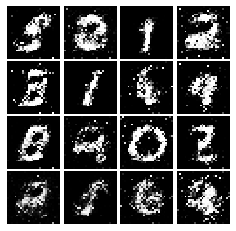

Epoch: 5, Iter: 2580, D: 1.288, G:1.406


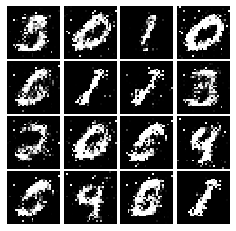

Epoch: 5, Iter: 2600, D: 1.449, G:0.7774


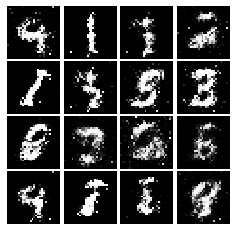

Epoch: 5, Iter: 2620, D: 1.312, G:0.9965


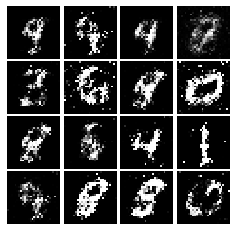

Epoch: 5, Iter: 2640, D: 1.212, G:0.7785


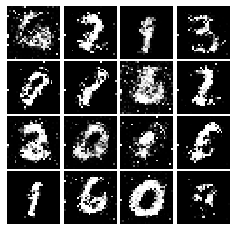

Epoch: 5, Iter: 2660, D: 1.359, G:0.8778


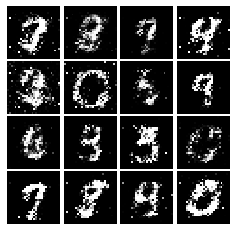

Epoch: 5, Iter: 2680, D: 1.316, G:0.9343


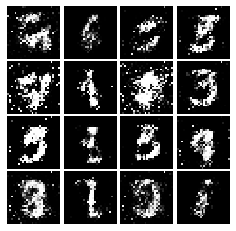

Epoch: 5, Iter: 2700, D: 1.334, G:0.7941


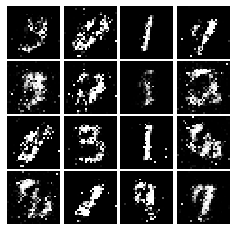

Epoch: 5, Iter: 2720, D: 1.317, G:0.7913


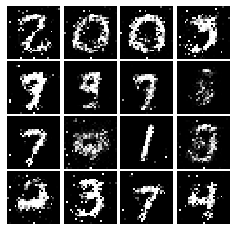

Epoch: 5, Iter: 2740, D: 1.261, G:0.9643


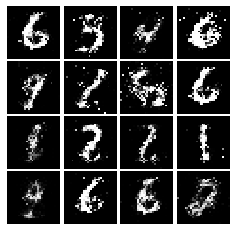

Epoch: 5, Iter: 2760, D: 1.348, G:0.7966


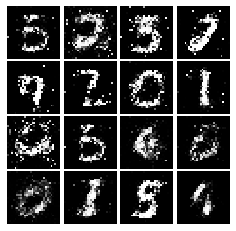

Epoch: 5, Iter: 2780, D: 1.267, G:0.8304


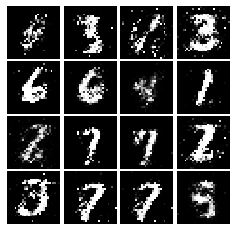

Epoch: 5, Iter: 2800, D: 1.367, G:0.8135


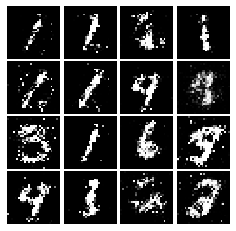

Epoch: 6, Iter: 2820, D: 1.359, G:0.8106


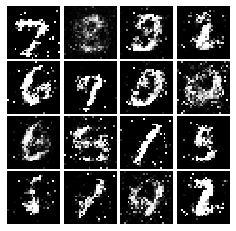

Epoch: 6, Iter: 2840, D: 1.232, G:1.063


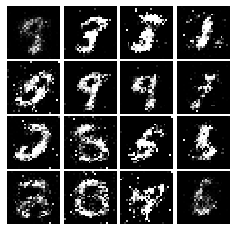

Epoch: 6, Iter: 2860, D: 1.288, G:0.8902


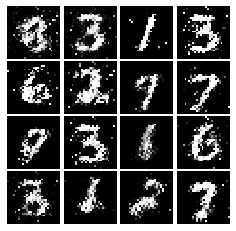

Epoch: 6, Iter: 2880, D: 1.256, G:0.8177


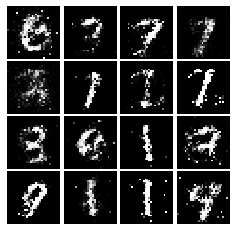

Epoch: 6, Iter: 2900, D: 1.39, G:0.8795


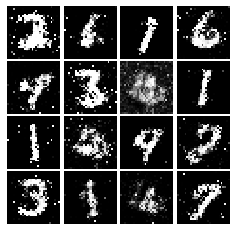

Epoch: 6, Iter: 2920, D: 1.318, G:0.7624


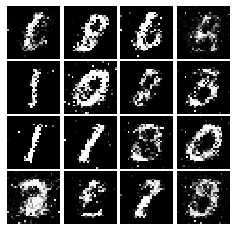

Epoch: 6, Iter: 2940, D: 1.312, G:0.7512


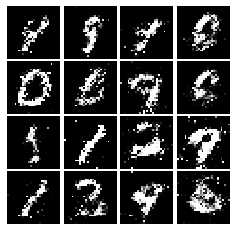

Epoch: 6, Iter: 2960, D: 1.265, G:0.8206


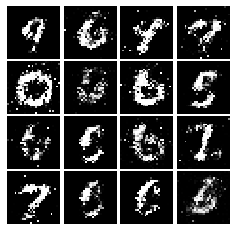

Epoch: 6, Iter: 2980, D: 1.255, G:0.9297


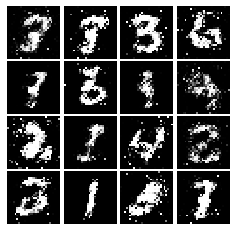

Epoch: 6, Iter: 3000, D: 1.26, G:0.8304


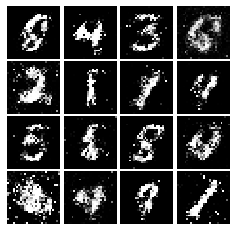

Epoch: 6, Iter: 3020, D: 1.308, G:0.9523


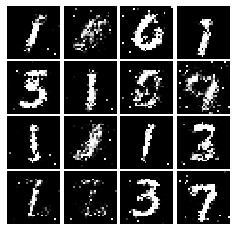

Epoch: 6, Iter: 3040, D: 1.277, G:0.9804


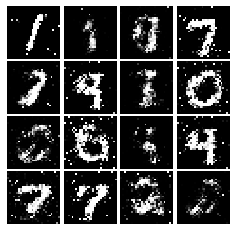

Epoch: 6, Iter: 3060, D: 1.326, G:0.7523


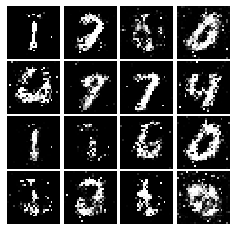

Epoch: 6, Iter: 3080, D: 1.3, G:0.8097


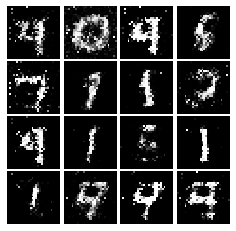

Epoch: 6, Iter: 3100, D: 1.336, G:0.877


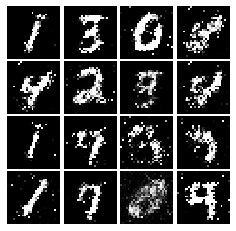

Epoch: 6, Iter: 3120, D: 1.372, G:0.7524


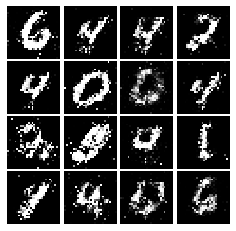

Epoch: 6, Iter: 3140, D: 1.307, G:0.8768


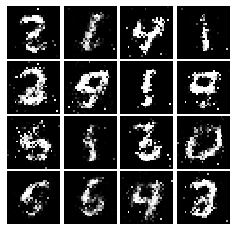

Epoch: 6, Iter: 3160, D: 1.317, G:0.7869


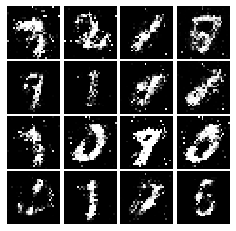

Epoch: 6, Iter: 3180, D: 1.343, G:0.7519


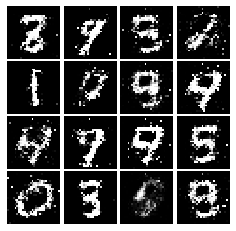

Epoch: 6, Iter: 3200, D: 1.292, G:0.8403


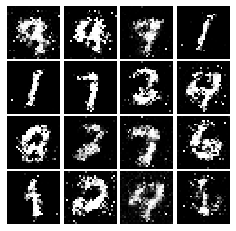

Epoch: 6, Iter: 3220, D: 1.361, G:0.7988


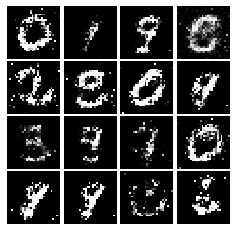

Epoch: 6, Iter: 3240, D: 1.229, G:0.8657


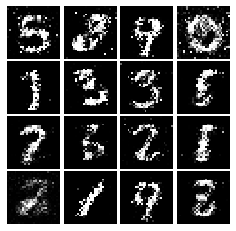

Epoch: 6, Iter: 3260, D: 1.381, G:0.8226


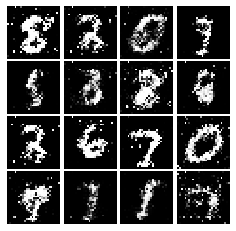

Epoch: 6, Iter: 3280, D: 1.253, G:0.953


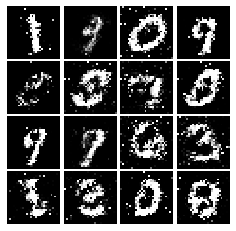

Epoch: 7, Iter: 3300, D: 1.196, G:0.8858


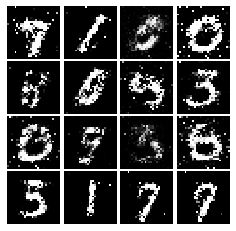

Epoch: 7, Iter: 3320, D: 1.324, G:0.8464


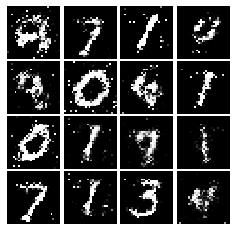

Epoch: 7, Iter: 3340, D: 1.214, G:0.844


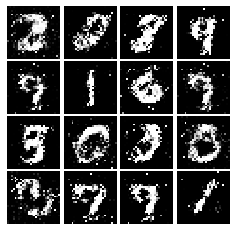

Epoch: 7, Iter: 3360, D: 1.345, G:0.8855


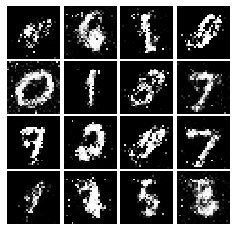

Epoch: 7, Iter: 3380, D: 1.32, G:0.8497


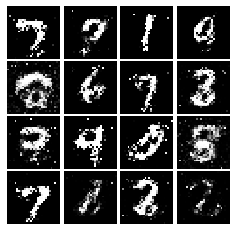

Epoch: 7, Iter: 3400, D: 1.363, G:0.8212


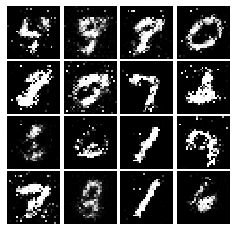

Epoch: 7, Iter: 3420, D: 1.291, G:0.9068


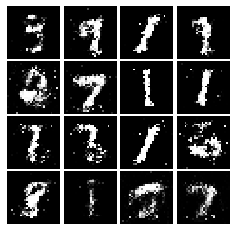

Epoch: 7, Iter: 3440, D: 1.263, G:0.8724


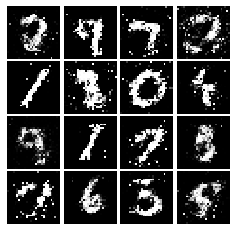

Epoch: 7, Iter: 3460, D: 1.335, G:0.8843


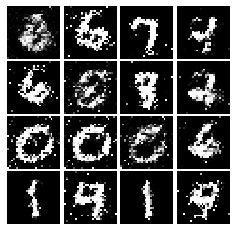

Epoch: 7, Iter: 3480, D: 1.346, G:0.7513


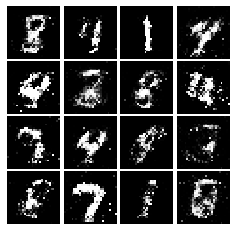

Epoch: 7, Iter: 3500, D: 1.407, G:0.767


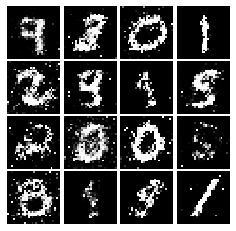

Epoch: 7, Iter: 3520, D: 1.39, G:0.8271


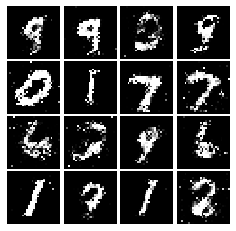

Epoch: 7, Iter: 3540, D: 1.328, G:0.8249


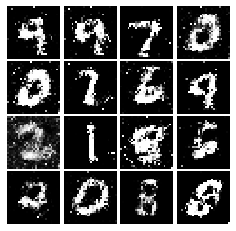

Epoch: 7, Iter: 3560, D: 1.29, G:0.8455


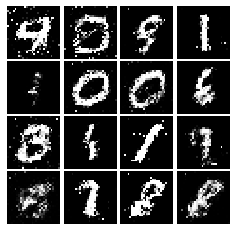

Epoch: 7, Iter: 3580, D: 1.303, G:0.8636


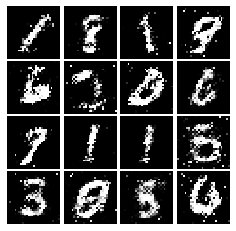

Epoch: 7, Iter: 3600, D: 1.319, G:0.7664


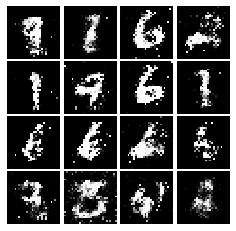

Epoch: 7, Iter: 3620, D: 1.279, G:0.8646


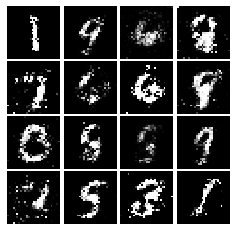

Epoch: 7, Iter: 3640, D: 1.315, G:0.7679


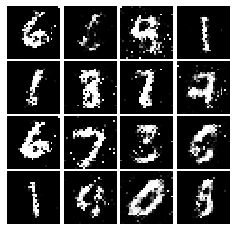

Epoch: 7, Iter: 3660, D: 1.41, G:0.9495


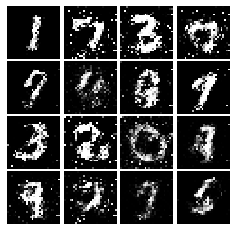

Epoch: 7, Iter: 3680, D: 1.24, G:0.7697


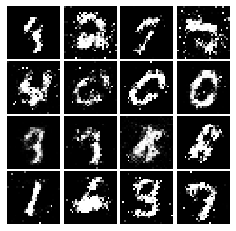

Epoch: 7, Iter: 3700, D: 1.329, G:0.7612


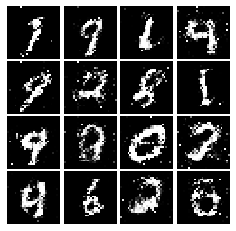

Epoch: 7, Iter: 3720, D: 1.269, G:0.903


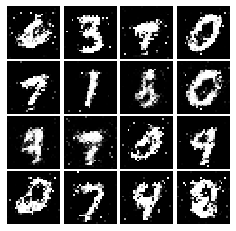

Epoch: 7, Iter: 3740, D: 1.402, G:0.828


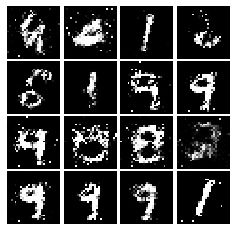

Epoch: 8, Iter: 3760, D: 1.329, G:0.7821


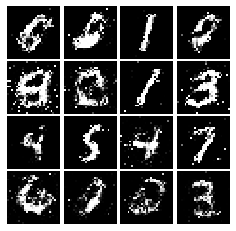

Epoch: 8, Iter: 3780, D: 1.332, G:0.8015


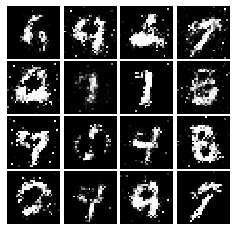

Epoch: 8, Iter: 3800, D: 1.318, G:0.8123


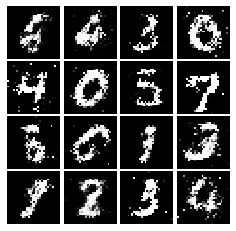

Epoch: 8, Iter: 3820, D: 1.304, G:0.8067


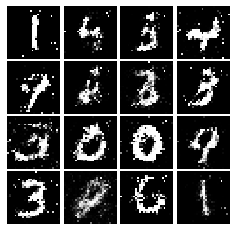

Epoch: 8, Iter: 3840, D: 1.332, G:0.7814


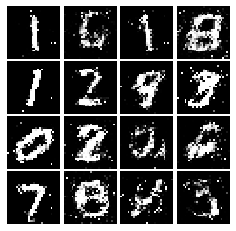

Epoch: 8, Iter: 3860, D: 1.406, G:0.8676


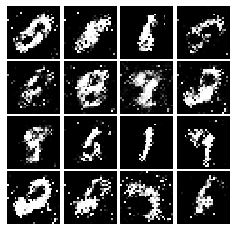

Epoch: 8, Iter: 3880, D: 1.39, G:0.7814


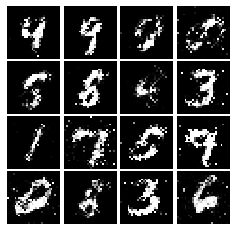

Epoch: 8, Iter: 3900, D: 1.33, G:0.8573


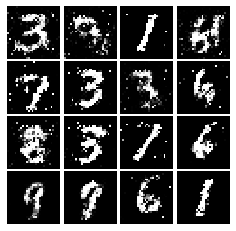

Epoch: 8, Iter: 3920, D: 1.309, G:0.8242


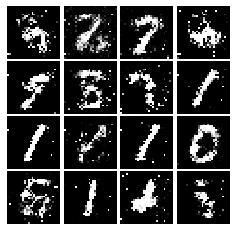

Epoch: 8, Iter: 3940, D: 1.324, G:0.7781


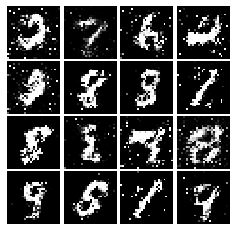

Epoch: 8, Iter: 3960, D: 1.305, G:0.809


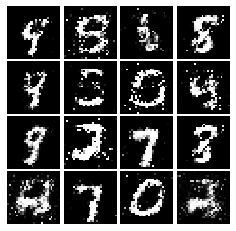

Epoch: 8, Iter: 3980, D: 1.416, G:0.8052


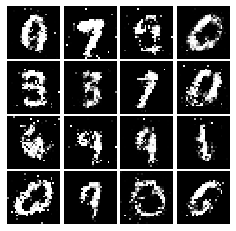

Epoch: 8, Iter: 4000, D: 1.274, G:0.7631


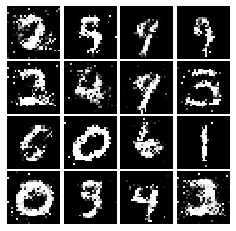

Epoch: 8, Iter: 4020, D: 1.27, G:0.786


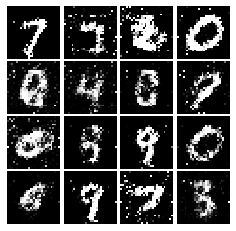

Epoch: 8, Iter: 4040, D: 1.403, G:0.9533


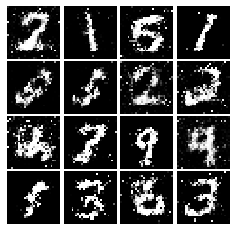

Epoch: 8, Iter: 4060, D: 1.243, G:0.8411


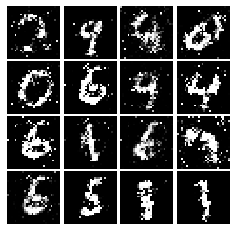

Epoch: 8, Iter: 4080, D: 1.364, G:0.7369


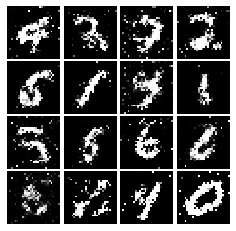

Epoch: 8, Iter: 4100, D: 1.379, G:0.7494


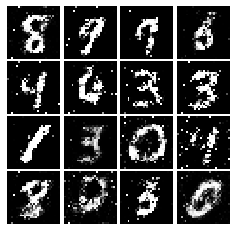

Epoch: 8, Iter: 4120, D: 1.306, G:0.7806


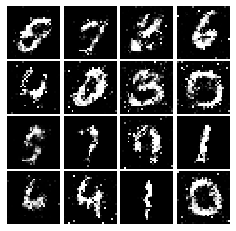

Epoch: 8, Iter: 4140, D: 1.338, G:0.8482


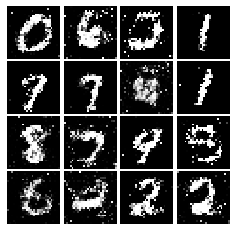

Epoch: 8, Iter: 4160, D: 1.355, G:0.8232


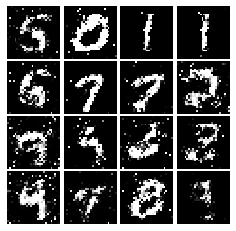

Epoch: 8, Iter: 4180, D: 1.374, G:0.8162


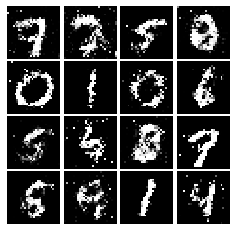

Epoch: 8, Iter: 4200, D: 1.328, G:0.7639


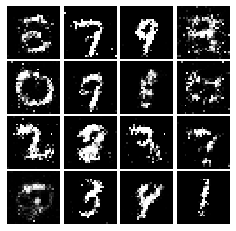

Epoch: 8, Iter: 4220, D: 1.339, G:0.9037


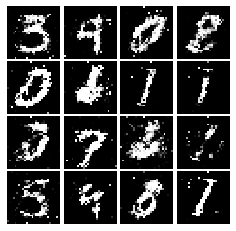

Epoch: 9, Iter: 4240, D: 1.373, G:0.7431


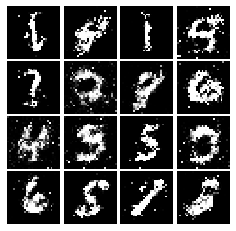

Epoch: 9, Iter: 4260, D: 1.388, G:0.8592


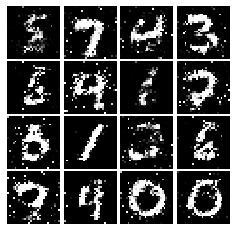

Epoch: 9, Iter: 4280, D: 1.297, G:0.8366


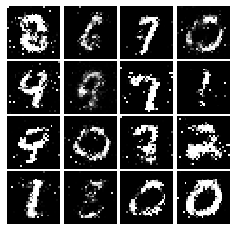

Epoch: 9, Iter: 4300, D: 1.4, G:0.827


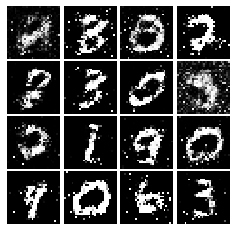

Epoch: 9, Iter: 4320, D: 1.286, G:0.8161


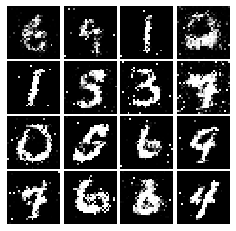

Epoch: 9, Iter: 4340, D: 1.351, G:0.8367


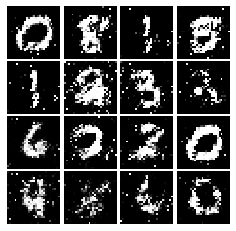

Epoch: 9, Iter: 4360, D: 1.36, G:0.7789


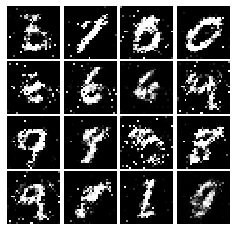

Epoch: 9, Iter: 4380, D: 1.35, G:0.9646


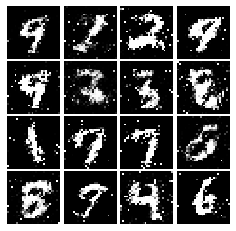

Epoch: 9, Iter: 4400, D: 1.348, G:0.9728


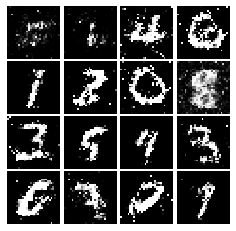

Epoch: 9, Iter: 4420, D: 1.274, G:0.766


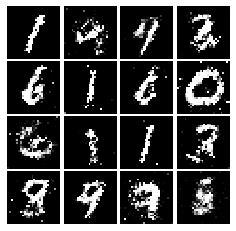

Epoch: 9, Iter: 4440, D: 1.369, G:0.789


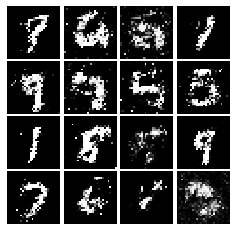

Epoch: 9, Iter: 4460, D: 1.335, G:0.9448


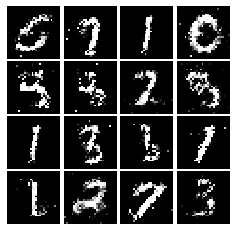

Epoch: 9, Iter: 4480, D: 1.326, G:0.8754


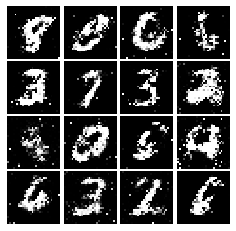

Epoch: 9, Iter: 4500, D: 1.393, G:0.8362


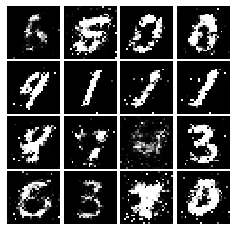

Epoch: 9, Iter: 4520, D: 1.353, G:0.8065


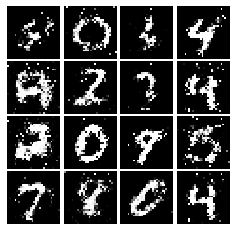

Epoch: 9, Iter: 4540, D: 1.335, G:0.8428


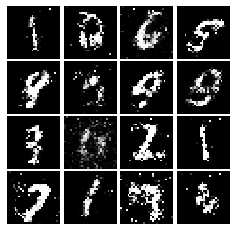

Epoch: 9, Iter: 4560, D: 1.224, G:0.782


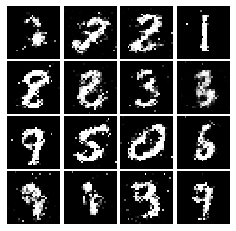

Epoch: 9, Iter: 4580, D: 1.299, G:0.8095


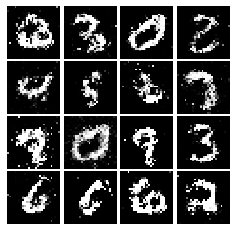

Epoch: 9, Iter: 4600, D: 1.349, G:0.7713


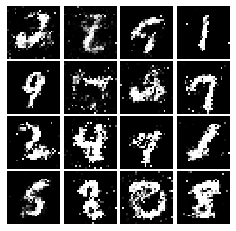

Epoch: 9, Iter: 4620, D: 1.286, G:0.8953


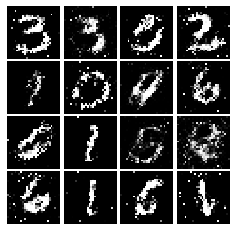

Epoch: 9, Iter: 4640, D: 1.305, G:0.8922


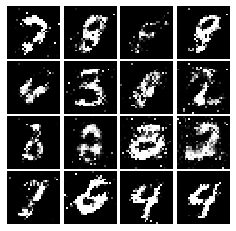

Epoch: 9, Iter: 4660, D: 1.386, G:0.8112


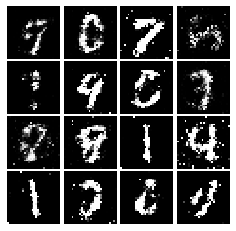

Epoch: 9, Iter: 4680, D: 1.265, G:0.7804


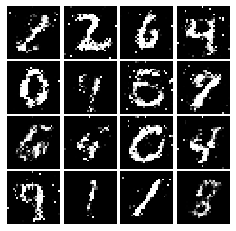

Final images


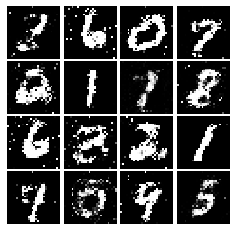

In [138]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [23]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * (tf.math.reduce_mean(tf.math.square(scores_real - 1))) + 0.5 * (tf.math.reduce_mean(tf.math.square(scores_fake)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * (tf.math.reduce_mean(tf.math.square(scores_fake - 1)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [24]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.535, G:0.5105


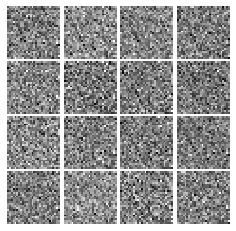

Epoch: 0, Iter: 20, D: 0.03264, G:0.818


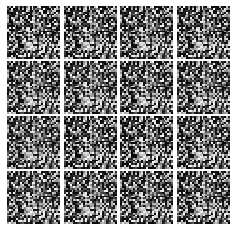

Epoch: 0, Iter: 40, D: 0.01527, G:0.7758


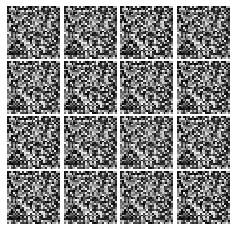

Epoch: 0, Iter: 60, D: 0.03914, G:0.9154


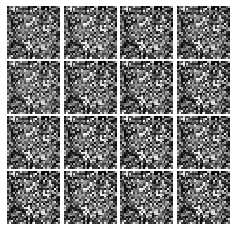

Epoch: 0, Iter: 80, D: 0.02415, G:0.6228


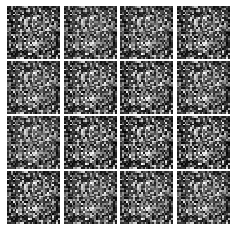

Epoch: 0, Iter: 100, D: 0.6697, G:0.1157


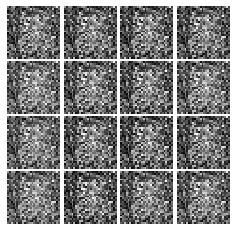

Epoch: 0, Iter: 120, D: 0.1684, G:0.5072


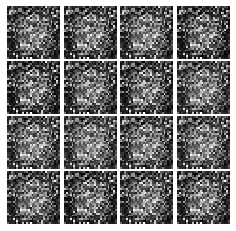

Epoch: 0, Iter: 140, D: 0.08386, G:0.4732


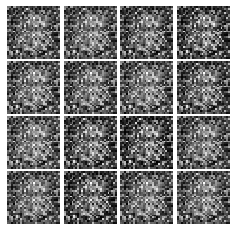

Epoch: 0, Iter: 160, D: 0.0859, G:0.3668


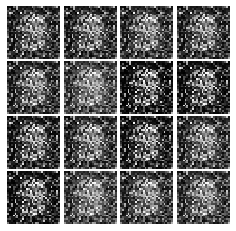

Epoch: 0, Iter: 180, D: 0.1438, G:0.2747


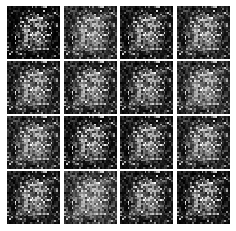

Epoch: 0, Iter: 200, D: 0.1941, G:0.3073


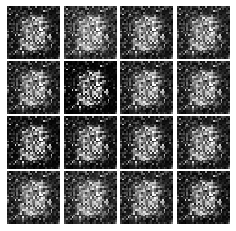

Epoch: 0, Iter: 220, D: 0.09397, G:0.4676


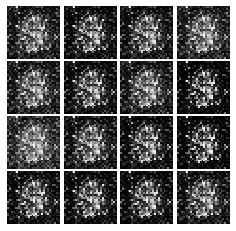

Epoch: 0, Iter: 240, D: 0.1585, G:0.4222


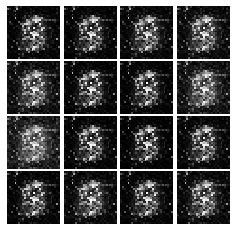

Epoch: 0, Iter: 260, D: 0.2233, G:0.3735


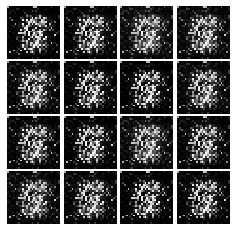

Epoch: 0, Iter: 280, D: 0.1533, G:0.6793


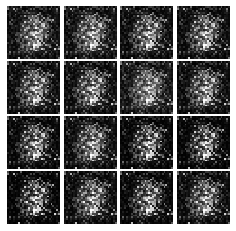

Epoch: 0, Iter: 300, D: 0.1985, G:0.3411


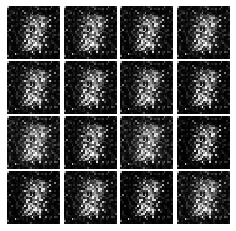

Epoch: 0, Iter: 320, D: 0.09404, G:0.4995


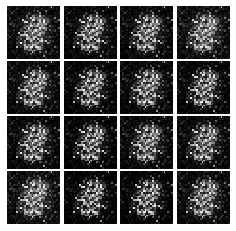

Epoch: 0, Iter: 340, D: 0.1064, G:0.4689


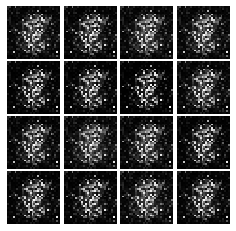

Epoch: 0, Iter: 360, D: 0.07275, G:0.5195


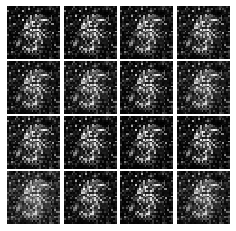

Epoch: 0, Iter: 380, D: 0.379, G:1.172


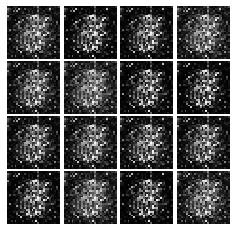

Epoch: 0, Iter: 400, D: 0.1307, G:0.4572


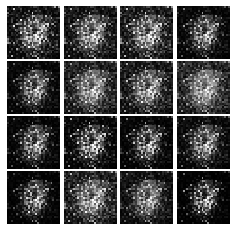

Epoch: 0, Iter: 420, D: 0.08375, G:0.4822


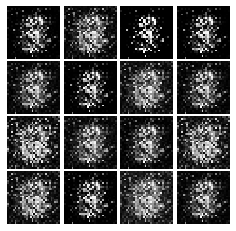

Epoch: 0, Iter: 440, D: 0.147, G:0.4887


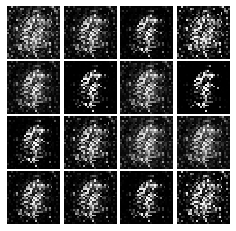

Epoch: 0, Iter: 460, D: 0.05395, G:0.5869


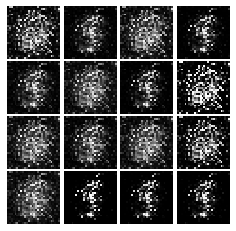

Epoch: 1, Iter: 480, D: 0.1743, G:0.518


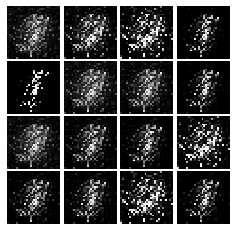

Epoch: 1, Iter: 500, D: 0.1792, G:0.7313


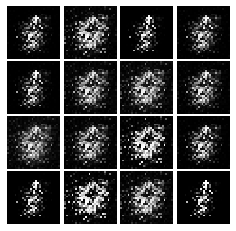

Epoch: 1, Iter: 520, D: 0.122, G:0.5631


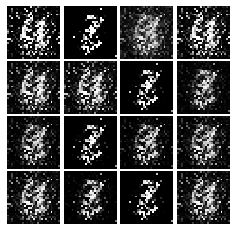

Epoch: 1, Iter: 540, D: 0.09179, G:0.467


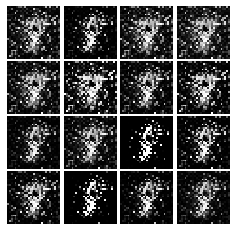

Epoch: 1, Iter: 560, D: 0.1037, G:0.401


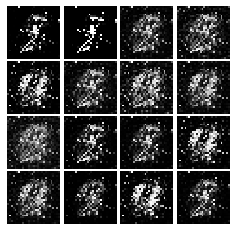

Epoch: 1, Iter: 580, D: 0.2482, G:1.013


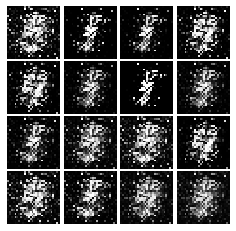

Epoch: 1, Iter: 600, D: 0.1675, G:0.5307


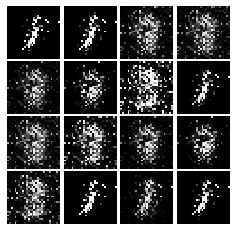

Epoch: 1, Iter: 620, D: 0.06584, G:0.5336


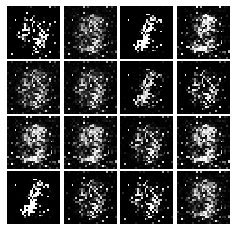

Epoch: 1, Iter: 640, D: 0.06259, G:0.436


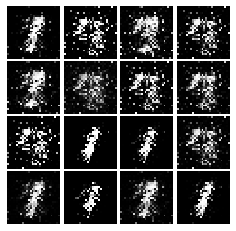

Epoch: 1, Iter: 660, D: 0.132, G:0.3435


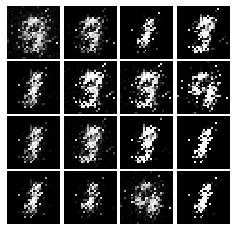

Epoch: 1, Iter: 680, D: 0.101, G:0.4607


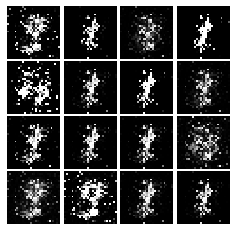

Epoch: 1, Iter: 700, D: 0.3399, G:0.3277


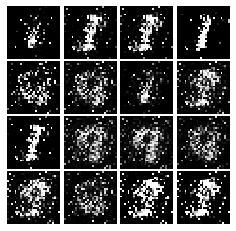

Epoch: 1, Iter: 720, D: 0.1546, G:0.3744


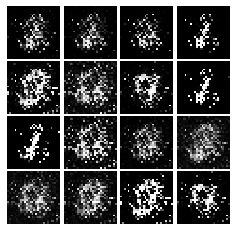

Epoch: 1, Iter: 740, D: 0.1011, G:0.3554


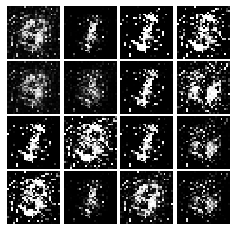

Epoch: 1, Iter: 760, D: 0.2762, G:0.3191


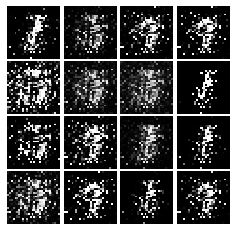

Epoch: 1, Iter: 780, D: 0.2857, G:0.6349


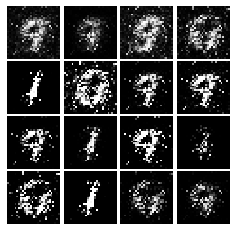

Epoch: 1, Iter: 800, D: 0.1272, G:0.5293


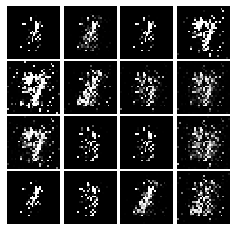

Epoch: 1, Iter: 820, D: 0.1289, G:0.2919


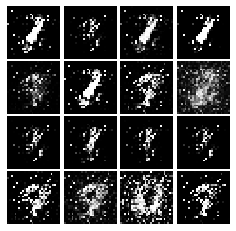

Epoch: 1, Iter: 840, D: 0.12, G:0.2151


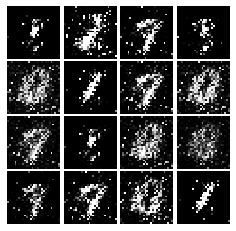

Epoch: 1, Iter: 860, D: 0.1238, G:0.2919


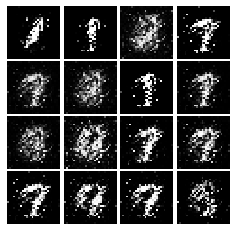

Epoch: 1, Iter: 880, D: 0.1811, G:0.3979


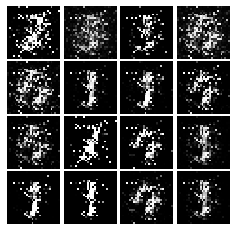

Epoch: 1, Iter: 900, D: 0.1521, G:0.2767


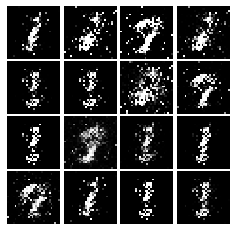

Epoch: 1, Iter: 920, D: 0.2346, G:0.3237


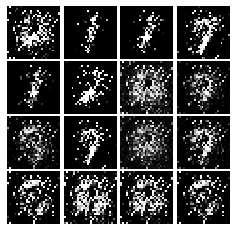

Epoch: 2, Iter: 940, D: 0.09286, G:0.5242


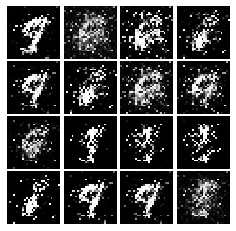

Epoch: 2, Iter: 960, D: 0.2189, G:0.3236


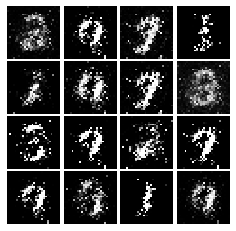

Epoch: 2, Iter: 980, D: 0.1357, G:0.2816


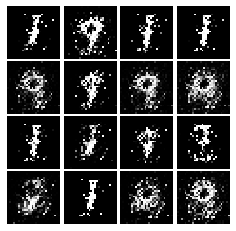

Epoch: 2, Iter: 1000, D: 0.2036, G:0.1231


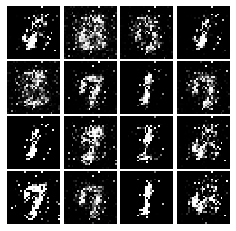

Epoch: 2, Iter: 1020, D: 0.1348, G:0.3184


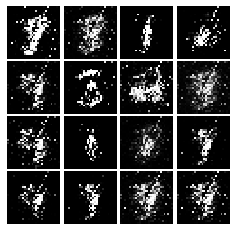

Epoch: 2, Iter: 1040, D: 0.2134, G:0.3328


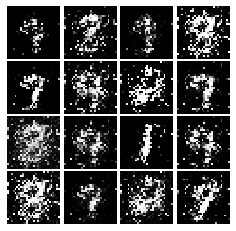

Epoch: 2, Iter: 1060, D: 0.1402, G:0.3191


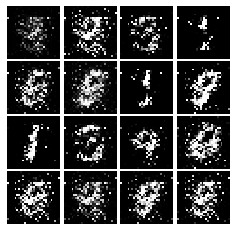

Epoch: 2, Iter: 1080, D: 0.1295, G:0.3792


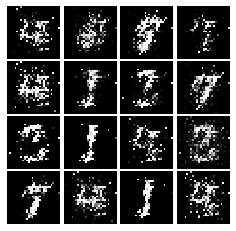

Epoch: 2, Iter: 1100, D: 0.151, G:0.3609


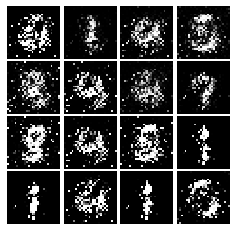

Epoch: 2, Iter: 1120, D: 0.1414, G:0.2287


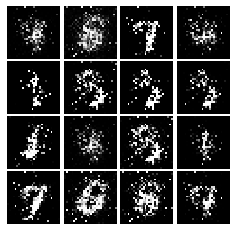

Epoch: 2, Iter: 1140, D: 0.1653, G:0.2516


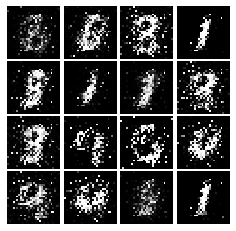

Epoch: 2, Iter: 1160, D: 0.1398, G:0.3679


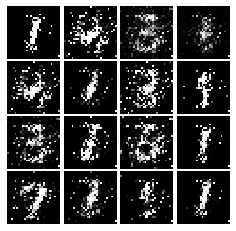

Epoch: 2, Iter: 1180, D: 0.1534, G:0.2481


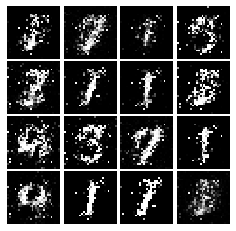

Epoch: 2, Iter: 1200, D: 0.1482, G:0.4524


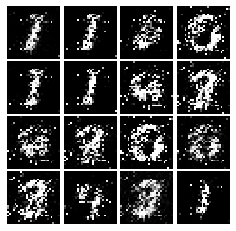

Epoch: 2, Iter: 1220, D: 0.169, G:0.3284


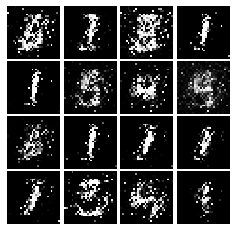

Epoch: 2, Iter: 1240, D: 0.1531, G:0.3404


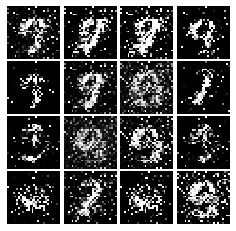

Epoch: 2, Iter: 1260, D: 0.1773, G:0.2952


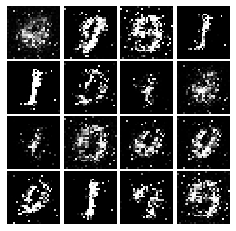

Epoch: 2, Iter: 1280, D: 0.1729, G:0.2392


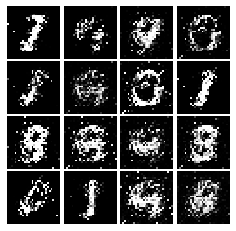

Epoch: 2, Iter: 1300, D: 0.1329, G:0.4508


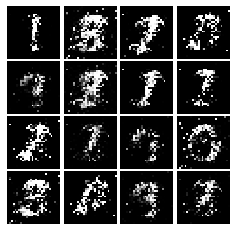

Epoch: 2, Iter: 1320, D: 0.2117, G:0.1889


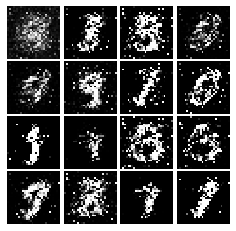

Epoch: 2, Iter: 1340, D: 0.1661, G:0.3389


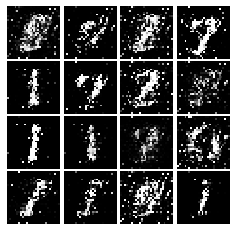

Epoch: 2, Iter: 1360, D: 0.2058, G:0.2617


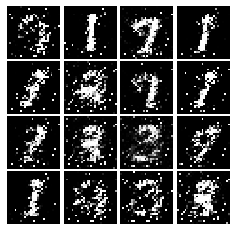

Epoch: 2, Iter: 1380, D: 0.1784, G:0.3092


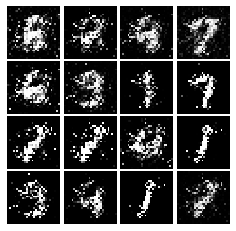

Epoch: 2, Iter: 1400, D: 0.1586, G:0.3541


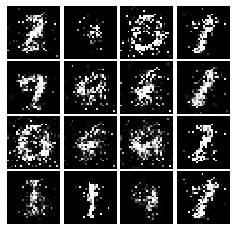

Epoch: 3, Iter: 1420, D: 0.159, G:0.2735


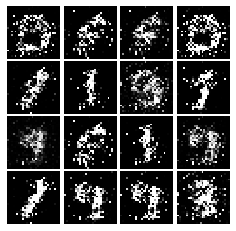

Epoch: 3, Iter: 1440, D: 0.1502, G:0.2583


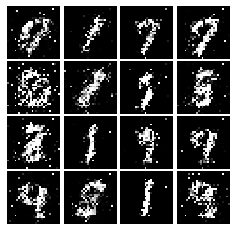

Epoch: 3, Iter: 1460, D: 0.2035, G:0.2501


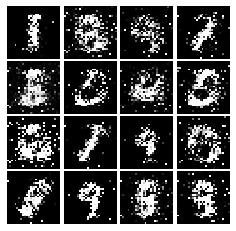

Epoch: 3, Iter: 1480, D: 0.1536, G:0.3244


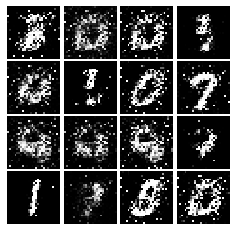

Epoch: 3, Iter: 1500, D: 0.1775, G:0.2399


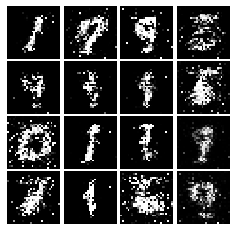

Epoch: 3, Iter: 1520, D: 0.1934, G:0.234


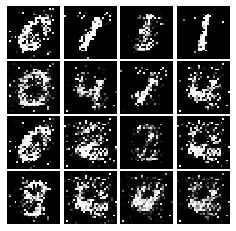

Epoch: 3, Iter: 1540, D: 0.1651, G:0.2534


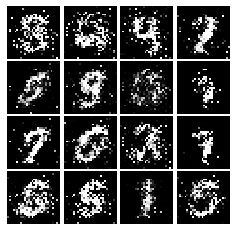

Epoch: 3, Iter: 1560, D: 0.1687, G:0.2771


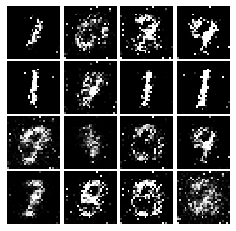

Epoch: 3, Iter: 1580, D: 0.1693, G:0.3055


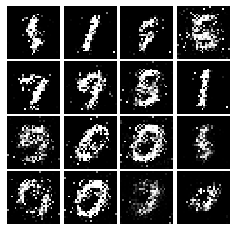

Epoch: 3, Iter: 1600, D: 0.1922, G:0.2997


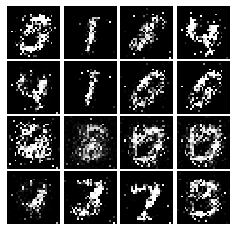

Epoch: 3, Iter: 1620, D: 0.1716, G:0.2428


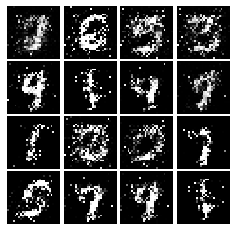

Epoch: 3, Iter: 1640, D: 0.1859, G:0.2493


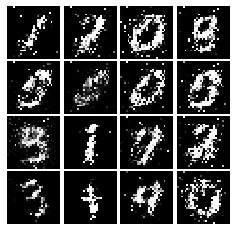

Epoch: 3, Iter: 1660, D: 0.1816, G:0.304


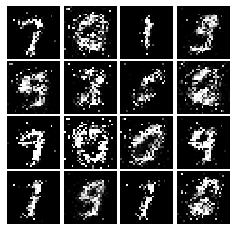

Epoch: 3, Iter: 1680, D: 0.1718, G:0.2409


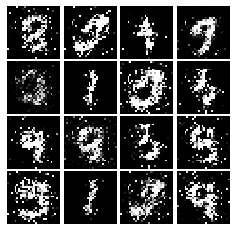

Epoch: 3, Iter: 1700, D: 0.1766, G:0.212


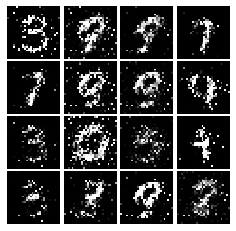

Epoch: 3, Iter: 1720, D: 0.2015, G:0.2121


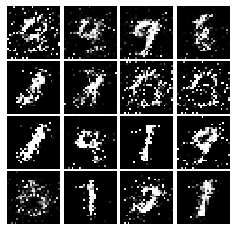

Epoch: 3, Iter: 1740, D: 0.208, G:0.2548


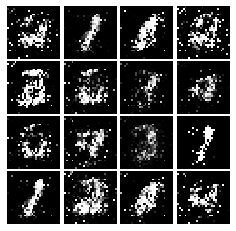

Epoch: 3, Iter: 1760, D: 0.2053, G:0.2015


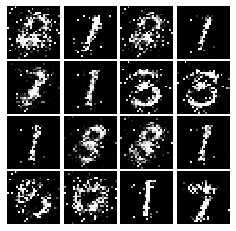

Epoch: 3, Iter: 1780, D: 0.1966, G:0.2136


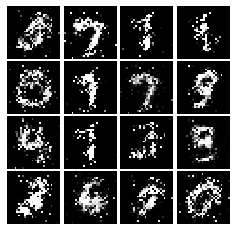

Epoch: 3, Iter: 1800, D: 0.2076, G:0.1954


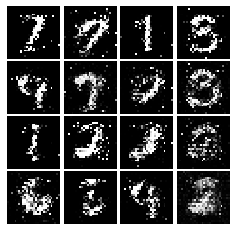

Epoch: 3, Iter: 1820, D: 0.2017, G:0.2621


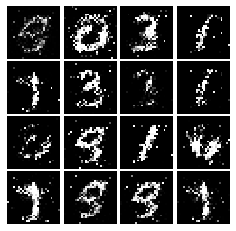

Epoch: 3, Iter: 1840, D: 0.2586, G:0.1816


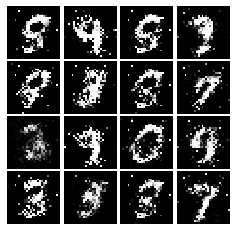

Epoch: 3, Iter: 1860, D: 0.2033, G:0.2266


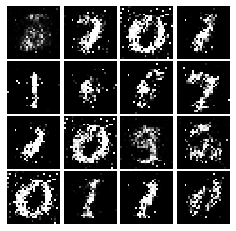

Epoch: 4, Iter: 1880, D: 0.2266, G:0.2365


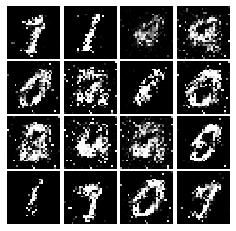

Epoch: 4, Iter: 1900, D: 0.198, G:0.222


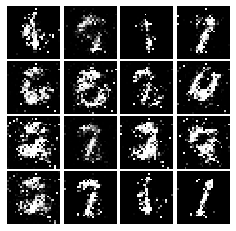

Epoch: 4, Iter: 1920, D: 0.1875, G:0.2049


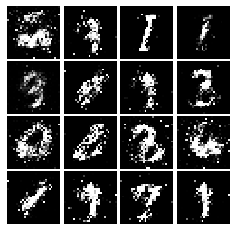

Epoch: 4, Iter: 1940, D: 0.2184, G:0.1599


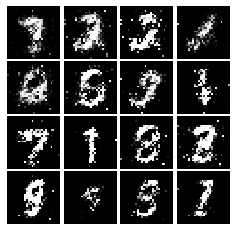

Epoch: 4, Iter: 1960, D: 0.208, G:0.2149


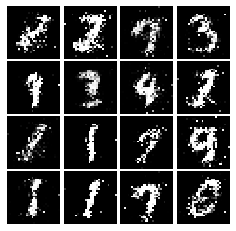

Epoch: 4, Iter: 1980, D: 0.1851, G:0.1975


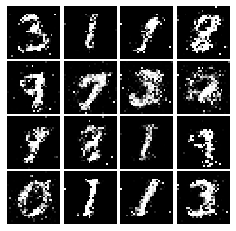

Epoch: 4, Iter: 2000, D: 0.2227, G:0.1882


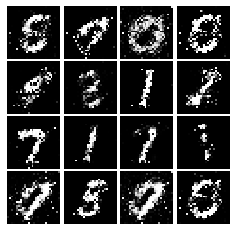

Epoch: 4, Iter: 2020, D: 0.2148, G:0.1902


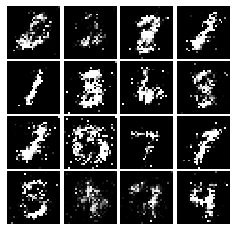

Epoch: 4, Iter: 2040, D: 0.2081, G:0.2132


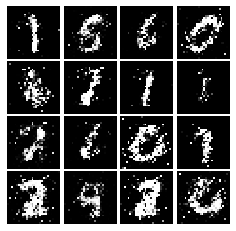

Epoch: 4, Iter: 2060, D: 0.2036, G:0.214


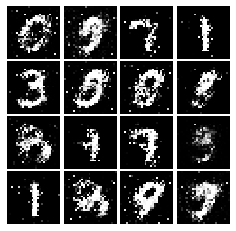

Epoch: 4, Iter: 2080, D: 0.2083, G:0.2051


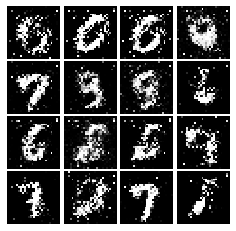

Epoch: 4, Iter: 2100, D: 0.186, G:0.2054


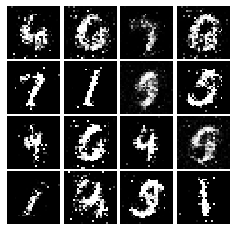

Epoch: 4, Iter: 2120, D: 0.2183, G:0.1952


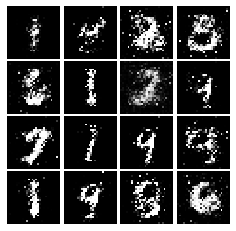

Epoch: 4, Iter: 2140, D: 0.199, G:0.199


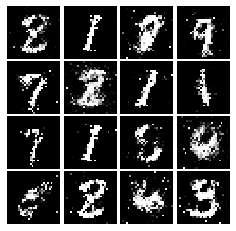

Epoch: 4, Iter: 2160, D: 0.2349, G:0.1987


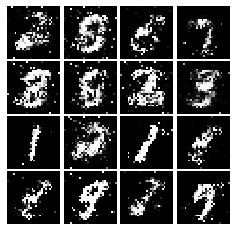

Epoch: 4, Iter: 2180, D: 0.2277, G:0.2149


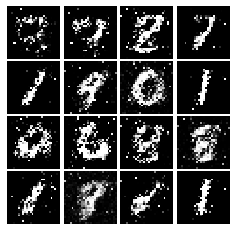

Epoch: 4, Iter: 2200, D: 0.1968, G:0.2701


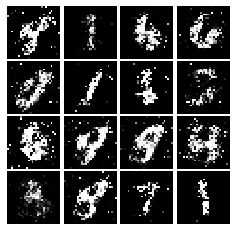

Epoch: 4, Iter: 2220, D: 0.2315, G:0.2045


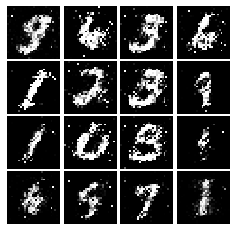

Epoch: 4, Iter: 2240, D: 0.229, G:0.1803


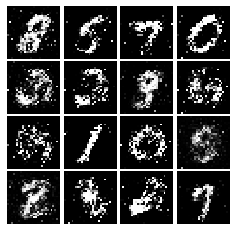

Epoch: 4, Iter: 2260, D: 0.2306, G:0.2814


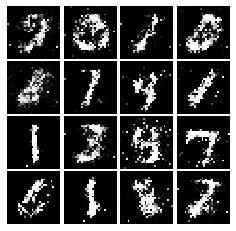

Epoch: 4, Iter: 2280, D: 0.2357, G:0.2151


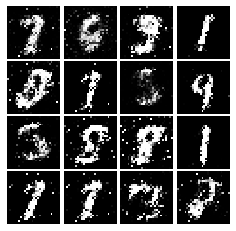

Epoch: 4, Iter: 2300, D: 0.205, G:0.2062


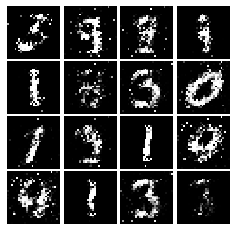

Epoch: 4, Iter: 2320, D: 0.2424, G:0.2425


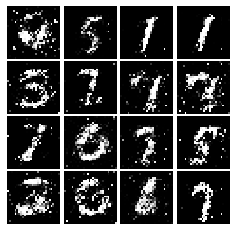

Epoch: 4, Iter: 2340, D: 0.2242, G:0.17


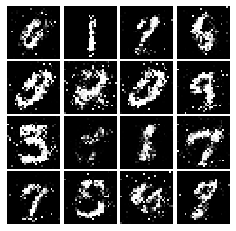

Epoch: 5, Iter: 2360, D: 0.2272, G:0.2056


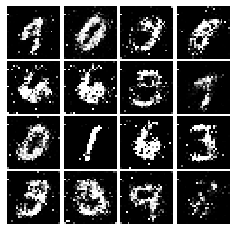

Epoch: 5, Iter: 2380, D: 0.2264, G:0.1796


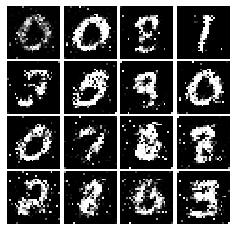

Epoch: 5, Iter: 2400, D: 0.204, G:0.2171


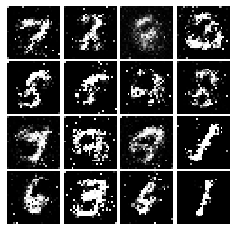

Epoch: 5, Iter: 2420, D: 0.193, G:0.2045


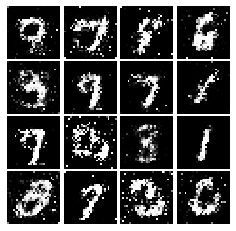

Epoch: 5, Iter: 2440, D: 0.2041, G:0.1992


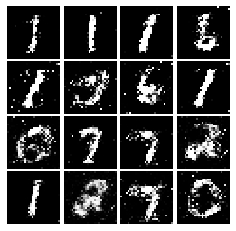

Epoch: 5, Iter: 2460, D: 0.2111, G:0.2016


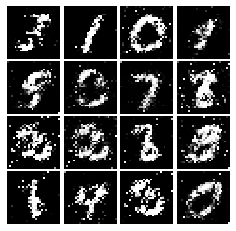

Epoch: 5, Iter: 2480, D: 0.2141, G:0.1901


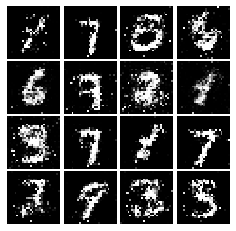

Epoch: 5, Iter: 2500, D: 0.191, G:0.2519


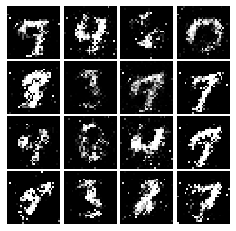

Epoch: 5, Iter: 2520, D: 0.2516, G:0.1334


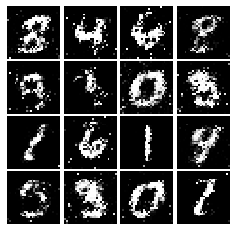

Epoch: 5, Iter: 2540, D: 0.2211, G:0.1886


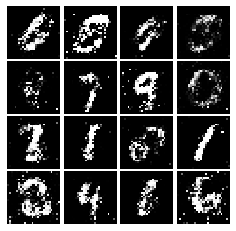

Epoch: 5, Iter: 2560, D: 0.2256, G:0.183


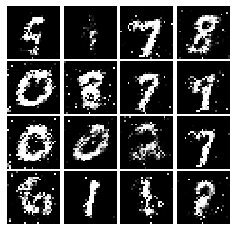

Epoch: 5, Iter: 2580, D: 0.2102, G:0.1765


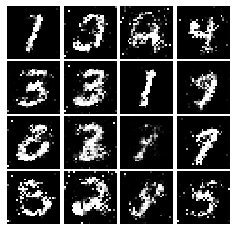

Epoch: 5, Iter: 2600, D: 0.2168, G:0.1499


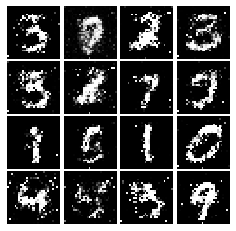

Epoch: 5, Iter: 2620, D: 0.2128, G:0.1993


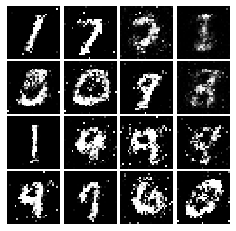

Epoch: 5, Iter: 2640, D: 0.2165, G:0.1947


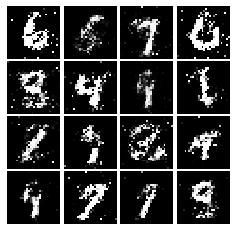

Epoch: 5, Iter: 2660, D: 0.228, G:0.1886


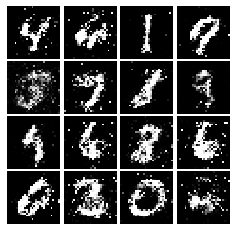

Epoch: 5, Iter: 2680, D: 0.2349, G:0.1722


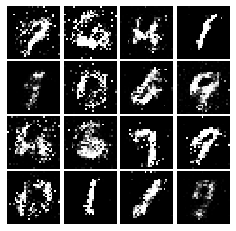

Epoch: 5, Iter: 2700, D: 0.2253, G:0.1858


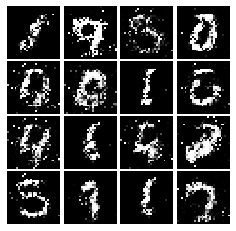

Epoch: 5, Iter: 2720, D: 0.2279, G:0.1506


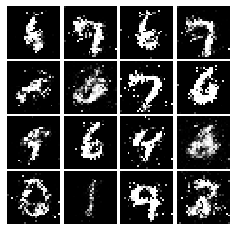

Epoch: 5, Iter: 2740, D: 0.1976, G:0.18


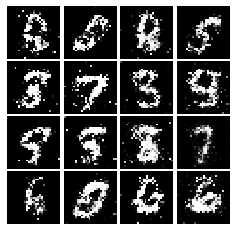

Epoch: 5, Iter: 2760, D: 0.2388, G:0.2017


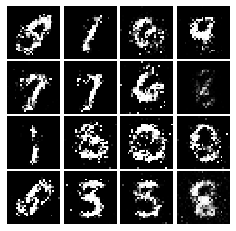

Epoch: 5, Iter: 2780, D: 0.1995, G:0.1779


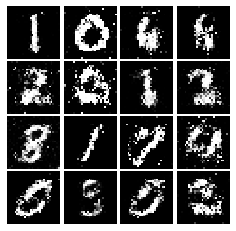

Epoch: 5, Iter: 2800, D: 0.2014, G:0.2028


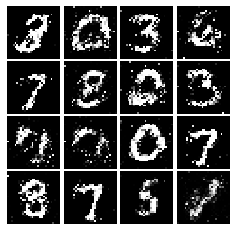

Epoch: 6, Iter: 2820, D: 0.2281, G:0.1473


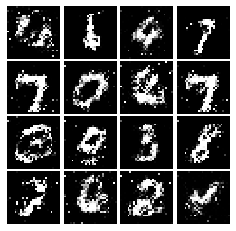

Epoch: 6, Iter: 2840, D: 0.2091, G:0.1955


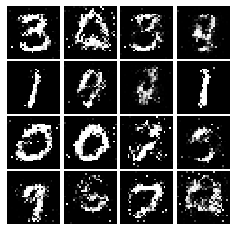

Epoch: 6, Iter: 2860, D: 0.2044, G:0.185


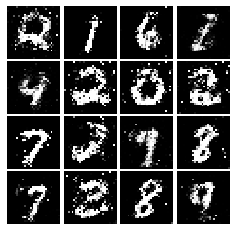

Epoch: 6, Iter: 2880, D: 0.2002, G:0.228


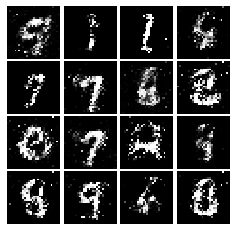

Epoch: 6, Iter: 2900, D: 0.2394, G:0.1728


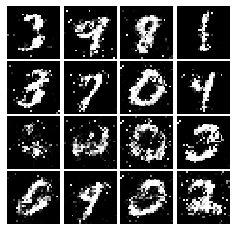

Epoch: 6, Iter: 2920, D: 0.2372, G:0.1668


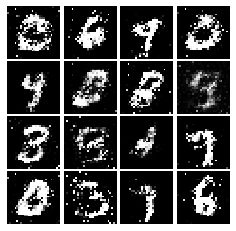

Epoch: 6, Iter: 2940, D: 0.2101, G:0.1608


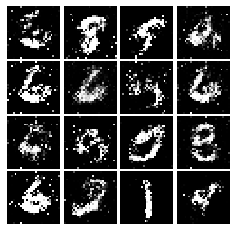

Epoch: 6, Iter: 2960, D: 0.2233, G:0.1782


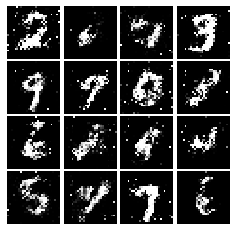

Epoch: 6, Iter: 2980, D: 0.2071, G:0.205


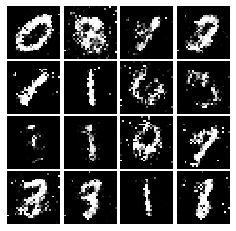

Epoch: 6, Iter: 3000, D: 0.2306, G:0.1648


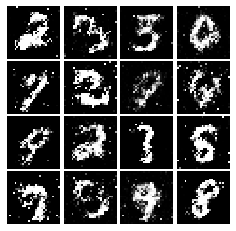

Epoch: 6, Iter: 3020, D: 0.225, G:0.1782


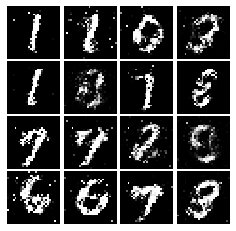

Epoch: 6, Iter: 3040, D: 0.2269, G:0.2267


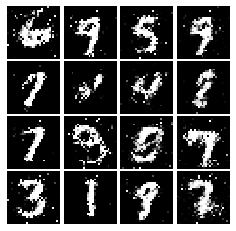

Epoch: 6, Iter: 3060, D: 0.2368, G:0.1627


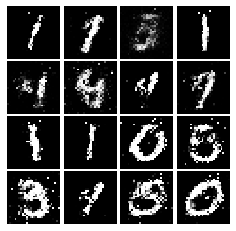

Epoch: 6, Iter: 3080, D: 0.2265, G:0.1583


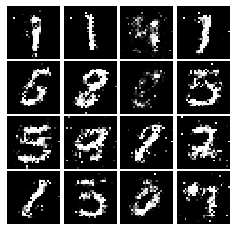

Epoch: 6, Iter: 3100, D: 0.2165, G:0.1621


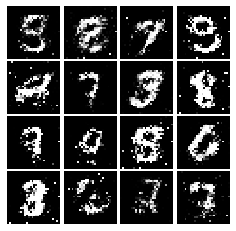

Epoch: 6, Iter: 3120, D: 0.2049, G:0.1608


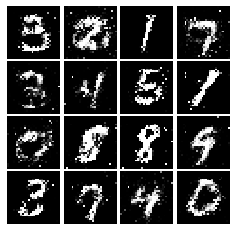

Epoch: 6, Iter: 3140, D: 0.2373, G:0.1494


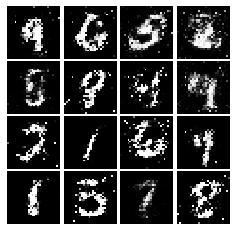

Epoch: 6, Iter: 3160, D: 0.208, G:0.1779


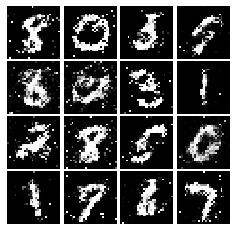

Epoch: 6, Iter: 3180, D: 0.2247, G:0.1794


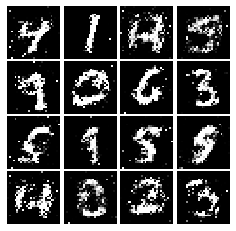

Epoch: 6, Iter: 3200, D: 0.2313, G:0.1771


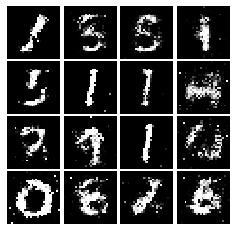

Epoch: 6, Iter: 3220, D: 0.2252, G:0.1316


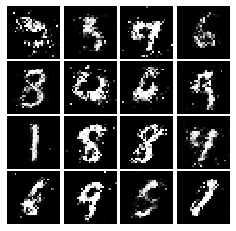

Epoch: 6, Iter: 3240, D: 0.2159, G:0.1808


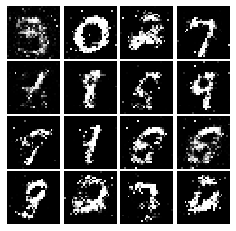

Epoch: 6, Iter: 3260, D: 0.264, G:0.1598


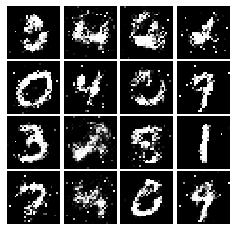

Epoch: 6, Iter: 3280, D: 0.2274, G:0.1882


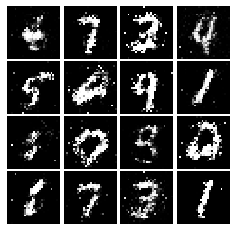

Epoch: 7, Iter: 3300, D: 0.2146, G:0.2082


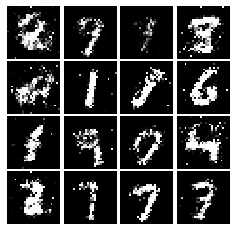

Epoch: 7, Iter: 3320, D: 0.2071, G:0.182


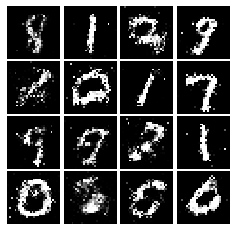

Epoch: 7, Iter: 3340, D: 0.2038, G:0.1882


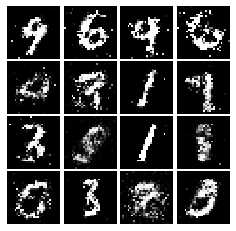

Epoch: 7, Iter: 3360, D: 0.2491, G:0.1518


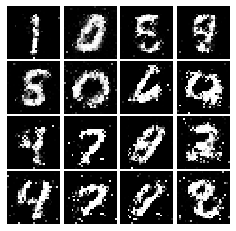

Epoch: 7, Iter: 3380, D: 0.218, G:0.1722


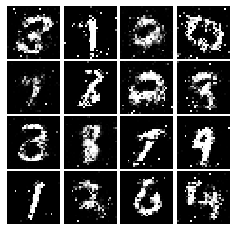

Epoch: 7, Iter: 3400, D: 0.22, G:0.2076


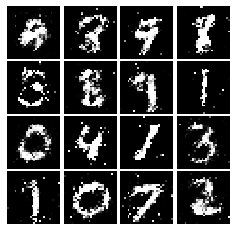

Epoch: 7, Iter: 3420, D: 0.2379, G:0.1686


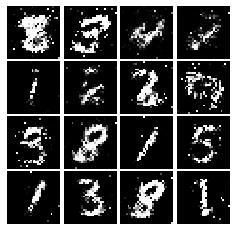

Epoch: 7, Iter: 3440, D: 0.2348, G:0.178


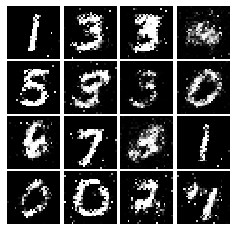

Epoch: 7, Iter: 3460, D: 0.2044, G:0.1877


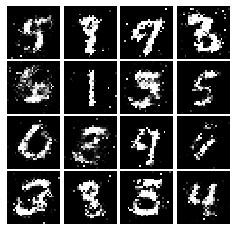

Epoch: 7, Iter: 3480, D: 0.2112, G:0.1757


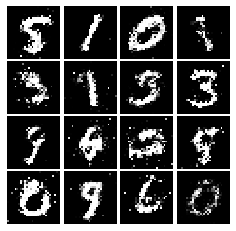

Epoch: 7, Iter: 3500, D: 0.2171, G:0.169


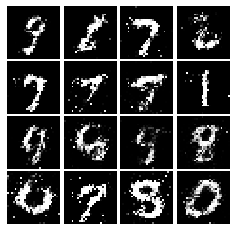

Epoch: 7, Iter: 3520, D: 0.2231, G:0.1783


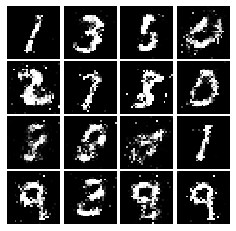

Epoch: 7, Iter: 3540, D: 0.2079, G:0.1718


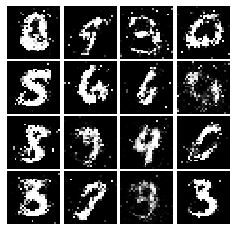

Epoch: 7, Iter: 3560, D: 0.2255, G:0.1614


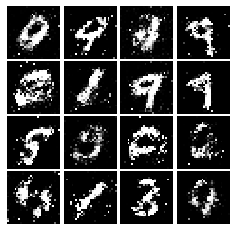

Epoch: 7, Iter: 3580, D: 0.22, G:0.1607


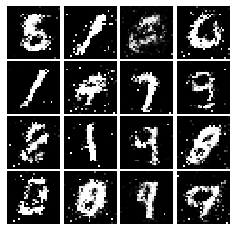

Epoch: 7, Iter: 3600, D: 0.2386, G:0.1718


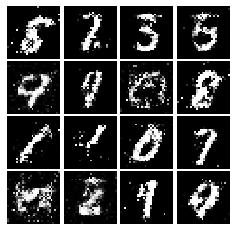

Epoch: 7, Iter: 3620, D: 0.2283, G:0.1637


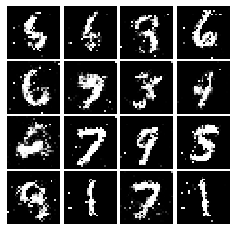

Epoch: 7, Iter: 3640, D: 0.2358, G:0.1841


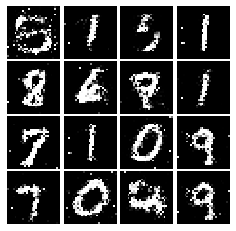

Epoch: 7, Iter: 3660, D: 0.2341, G:0.1591


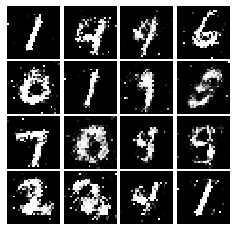

Epoch: 7, Iter: 3680, D: 0.2464, G:0.1711


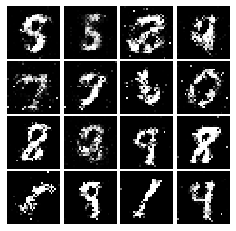

Epoch: 7, Iter: 3700, D: 0.2333, G:0.1755


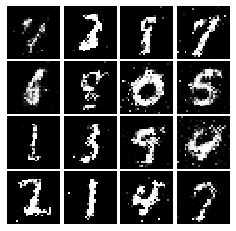

Epoch: 7, Iter: 3720, D: 0.2186, G:0.1814


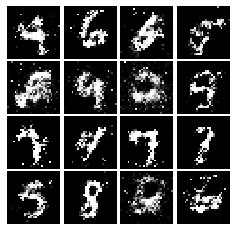

Epoch: 7, Iter: 3740, D: 0.2378, G:0.1839


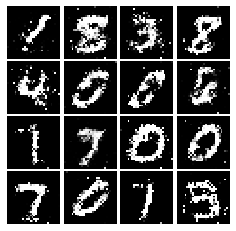

Epoch: 8, Iter: 3760, D: 0.217, G:0.2122


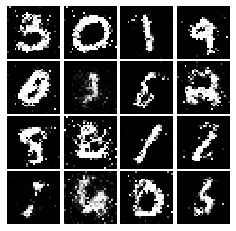

Epoch: 8, Iter: 3780, D: 0.2747, G:0.192


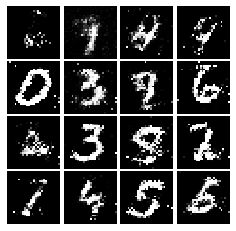

Epoch: 8, Iter: 3800, D: 0.2284, G:0.1579


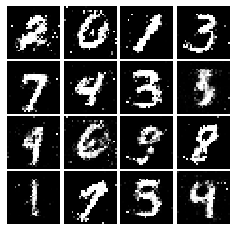

Epoch: 8, Iter: 3820, D: 0.2367, G:0.1724


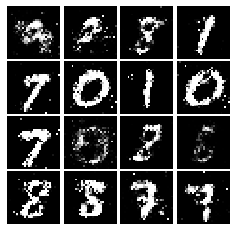

Epoch: 8, Iter: 3840, D: 0.2405, G:0.1828


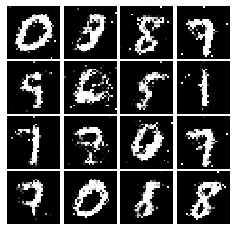

Epoch: 8, Iter: 3860, D: 0.2146, G:0.1826


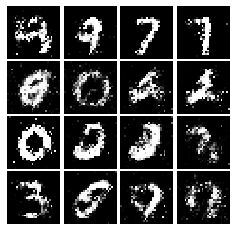

Epoch: 8, Iter: 3880, D: 0.2271, G:0.1523


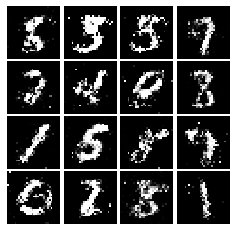

Epoch: 8, Iter: 3900, D: 0.2519, G:0.1748


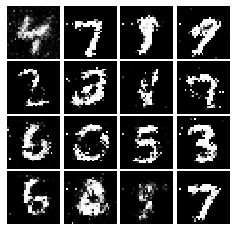

Epoch: 8, Iter: 3920, D: 0.2103, G:0.1739


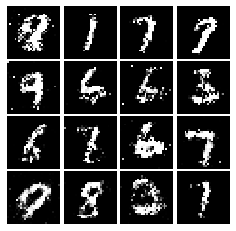

Epoch: 8, Iter: 3940, D: 0.2441, G:0.1548


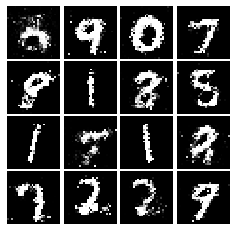

Epoch: 8, Iter: 3960, D: 0.2372, G:0.1596


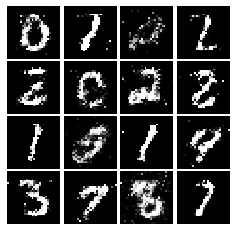

Epoch: 8, Iter: 3980, D: 0.2145, G:0.1792


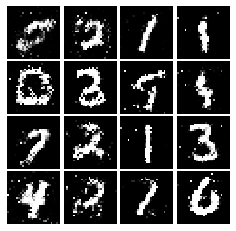

Epoch: 8, Iter: 4000, D: 0.2244, G:0.1778


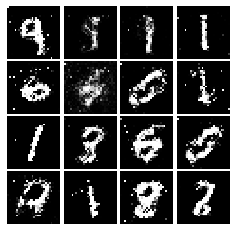

Epoch: 8, Iter: 4020, D: 0.2243, G:0.1522


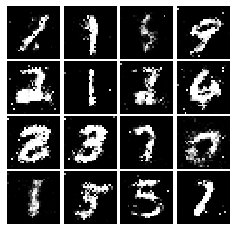

Epoch: 8, Iter: 4040, D: 0.2207, G:0.1558


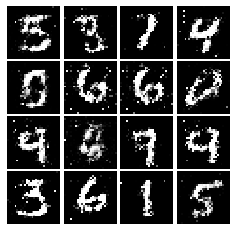

Epoch: 8, Iter: 4060, D: 0.2406, G:0.1511


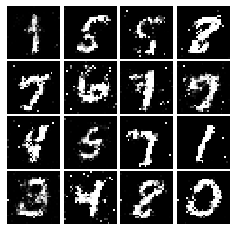

Epoch: 8, Iter: 4080, D: 0.2343, G:0.1541


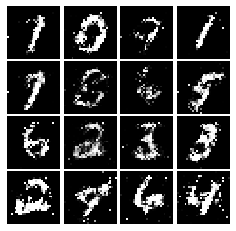

Epoch: 8, Iter: 4100, D: 0.2273, G:0.1614


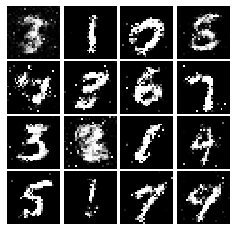

Epoch: 8, Iter: 4120, D: 0.2458, G:0.1455


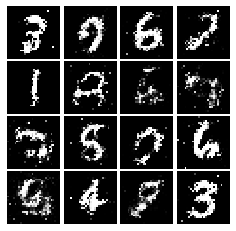

Epoch: 8, Iter: 4140, D: 0.2466, G:0.1786


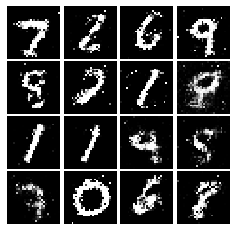

Epoch: 8, Iter: 4160, D: 0.2448, G:0.1489


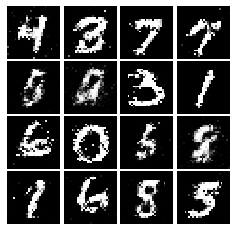

Epoch: 8, Iter: 4180, D: 0.2538, G:0.1633


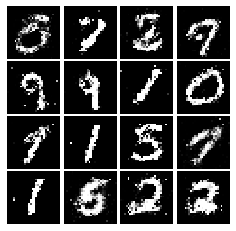

Epoch: 8, Iter: 4200, D: 0.2556, G:0.1662


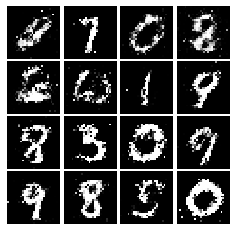

Epoch: 8, Iter: 4220, D: 0.189, G:0.2067


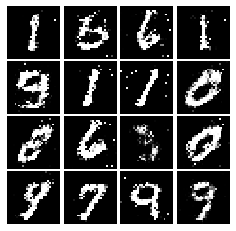

Epoch: 9, Iter: 4240, D: 0.2525, G:0.1313


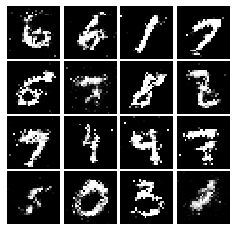

Epoch: 9, Iter: 4260, D: 0.2377, G:0.1779


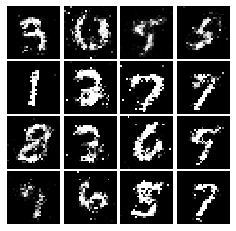

Epoch: 9, Iter: 4280, D: 0.2389, G:0.1877


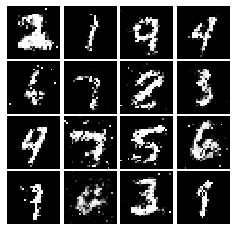

Epoch: 9, Iter: 4300, D: 0.2298, G:0.173


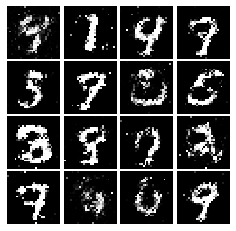

Epoch: 9, Iter: 4320, D: 0.2527, G:0.1614


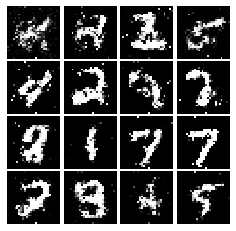

Epoch: 9, Iter: 4340, D: 0.2377, G:0.1551


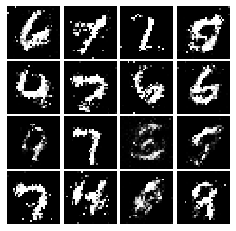

Epoch: 9, Iter: 4360, D: 0.2383, G:0.1362


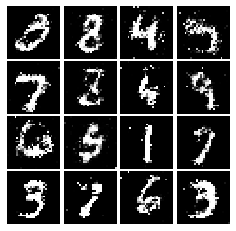

Epoch: 9, Iter: 4380, D: 0.2611, G:0.1473


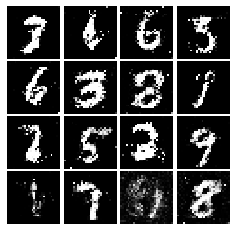

Epoch: 9, Iter: 4400, D: 0.2349, G:0.1634


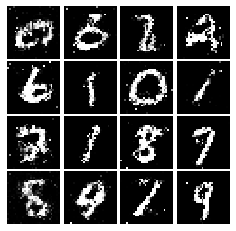

Epoch: 9, Iter: 4420, D: 0.2193, G:0.1875


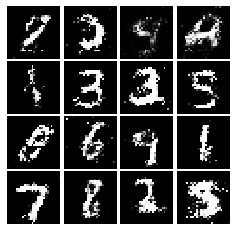

Epoch: 9, Iter: 4440, D: 0.2224, G:0.1944


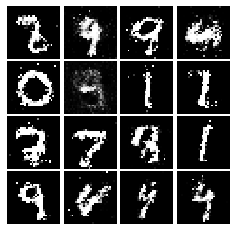

Epoch: 9, Iter: 4460, D: 0.2342, G:0.1727


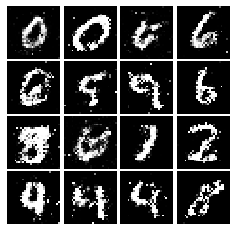

Epoch: 9, Iter: 4480, D: 0.2116, G:0.1696


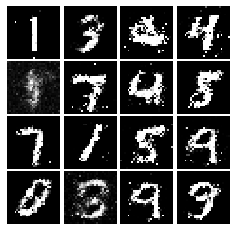

Epoch: 9, Iter: 4500, D: 0.241, G:0.1585


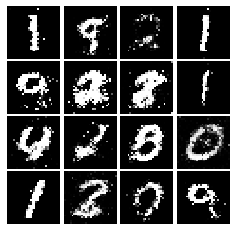

Epoch: 9, Iter: 4520, D: 0.2298, G:0.1539


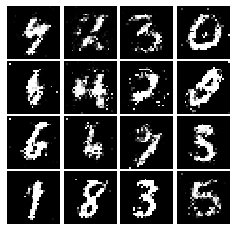

Epoch: 9, Iter: 4540, D: 0.2415, G:0.167


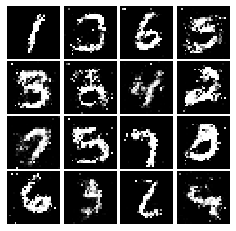

Epoch: 9, Iter: 4560, D: 0.2288, G:0.1548


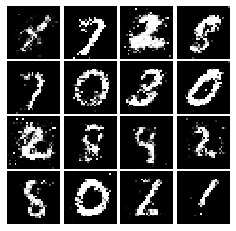

Epoch: 9, Iter: 4580, D: 0.2543, G:0.1795


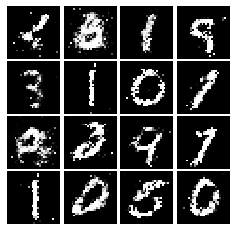

Epoch: 9, Iter: 4600, D: 0.2424, G:0.1637


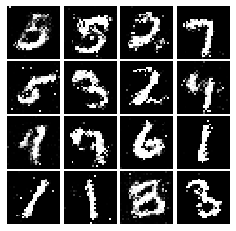

Epoch: 9, Iter: 4620, D: 0.2293, G:0.1884


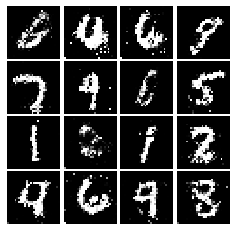

Epoch: 9, Iter: 4640, D: 0.2335, G:0.1616


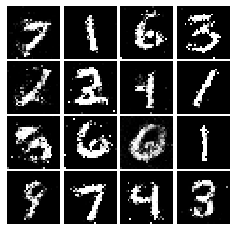

Epoch: 9, Iter: 4660, D: 0.2247, G:0.1559


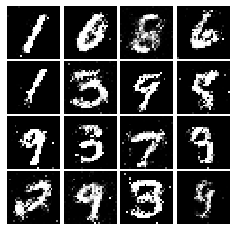

Epoch: 9, Iter: 4680, D: 0.2649, G:0.1649


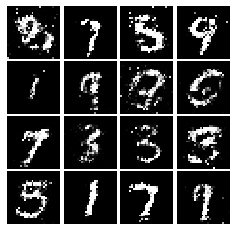

Final images


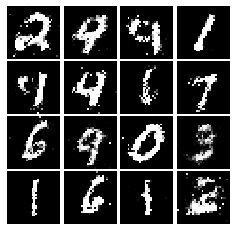

In [25]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [27]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28, 28, 1)),
        tf.keras.layers.Conv2D(32, kernel_size=[5,5], padding='valid', data_format='channels_last', 
                               activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2,2)),
        tf.keras.layers.Conv2D(64, kernel_size=[5,5], padding='valid',strides=[1, 1], data_format='channels_last', 
                               activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2,2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024, activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.Dense(1, activation=None)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          multiple                  0         
_________________________________________________________________
conv2d_2 (Conv2D)            multiple                  832       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 multiple                  0         
_________________________________________________________________
conv2d_3 (Conv2D)            multiple                  51264     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 multiple                  0         
_________________________________________________________________
flatten_1 (Flatten)          multiple                  0         
_________________________________________________________________
dense_14 (Dense)             multiple                 

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [30]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(64, kernel_size=[4,4], padding='same', strides=[2,2], data_format='channels_last', 
                               activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, kernel_size=[4,4], padding='same', strides=[2,2], data_format='channels_last', 
                               activation='tanh')
        
        
        
        
        
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
    ])

    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.347, G:0.6579


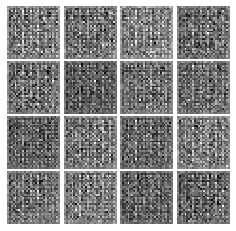

Epoch: 0, Iter: 20, D: 2.067, G:0.9739


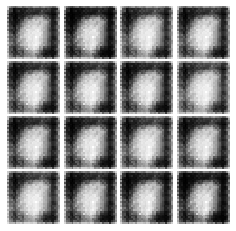

Epoch: 0, Iter: 40, D: 0.504, G:1.685


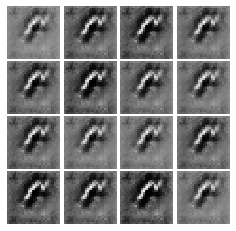

Epoch: 0, Iter: 60, D: 1.027, G:2.898


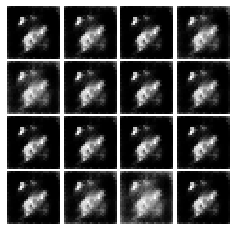

Epoch: 0, Iter: 80, D: 0.4907, G:2.28


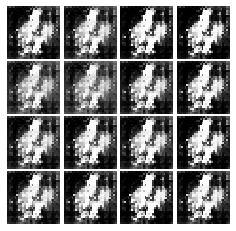

Epoch: 0, Iter: 100, D: 0.4171, G:2.649


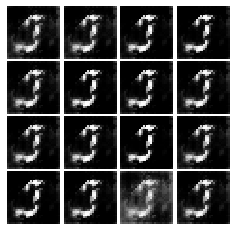

Epoch: 0, Iter: 120, D: 0.3086, G:3.087


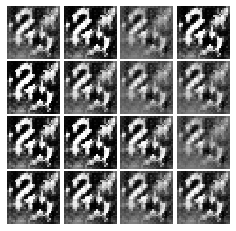

Epoch: 0, Iter: 140, D: 0.8343, G:3.129


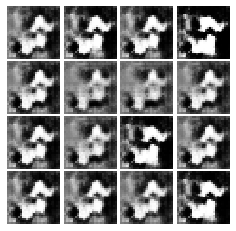

Epoch: 0, Iter: 160, D: 0.0526, G:4.423


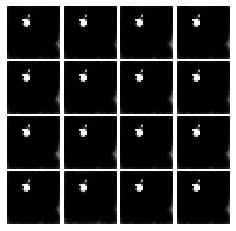

Epoch: 0, Iter: 180, D: 11.4, G:10.6


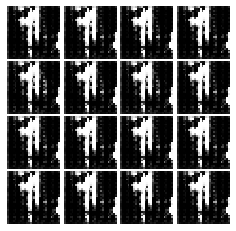

Epoch: 0, Iter: 200, D: 0.2878, G:2.143


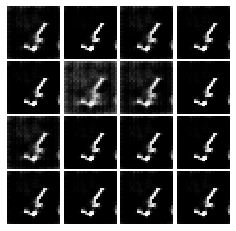

Epoch: 0, Iter: 220, D: 0.6165, G:2.426


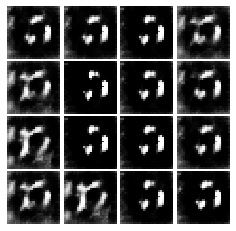

Epoch: 0, Iter: 240, D: 1.173, G:2.732


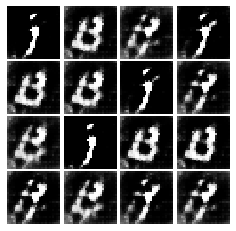

Epoch: 0, Iter: 260, D: 0.5751, G:2.697


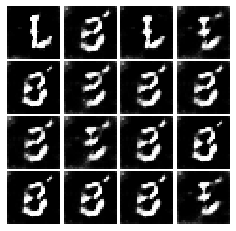

Epoch: 0, Iter: 280, D: 0.4983, G:3.724


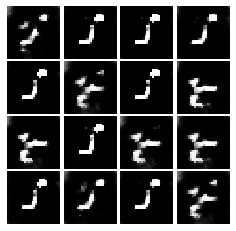

Epoch: 0, Iter: 300, D: 0.717, G:3.42


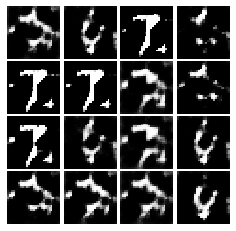

Epoch: 0, Iter: 320, D: 0.5199, G:2.524


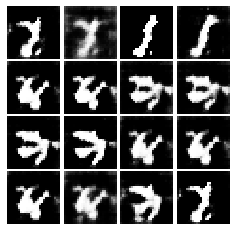

Epoch: 0, Iter: 340, D: 0.8264, G:2.485


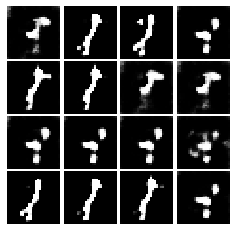

Epoch: 0, Iter: 360, D: 2.071, G:1.433


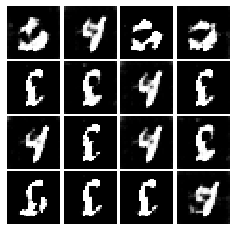

Epoch: 0, Iter: 380, D: 0.5366, G:4.467


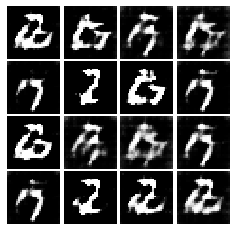

Epoch: 0, Iter: 400, D: 0.6236, G:3.139


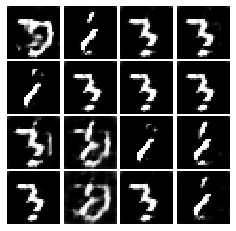

Epoch: 0, Iter: 420, D: 0.646, G:2.504


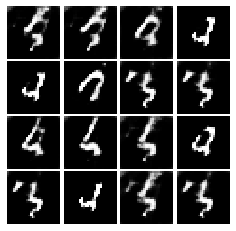

Epoch: 0, Iter: 440, D: 0.5942, G:2.63


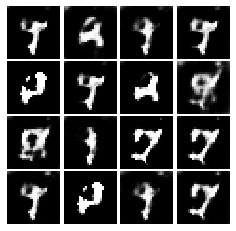

Epoch: 0, Iter: 460, D: 0.301, G:4.206


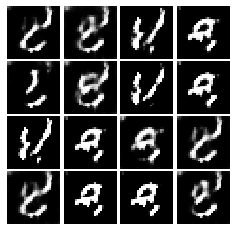

Epoch: 1, Iter: 480, D: 0.6242, G:1.92


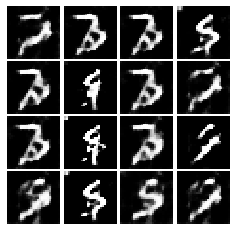

Epoch: 1, Iter: 500, D: 0.5313, G:2.215


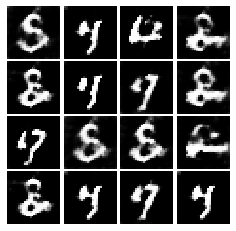

Epoch: 1, Iter: 520, D: 0.6413, G:2.237


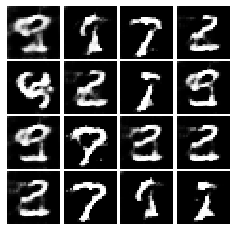

Epoch: 1, Iter: 540, D: 0.5063, G:3.654


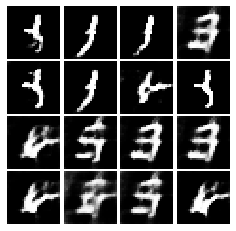

Epoch: 1, Iter: 560, D: 0.4568, G:3.42


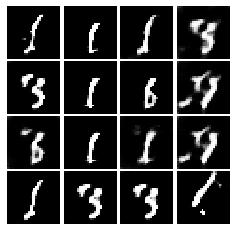

Epoch: 1, Iter: 580, D: 0.5519, G:2.912


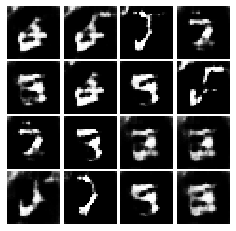

Epoch: 1, Iter: 600, D: 0.6349, G:3.015


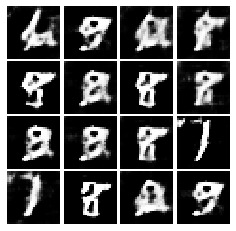

Epoch: 1, Iter: 620, D: 0.4375, G:2.923


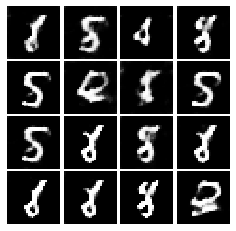

Epoch: 1, Iter: 640, D: 0.7412, G:2.09


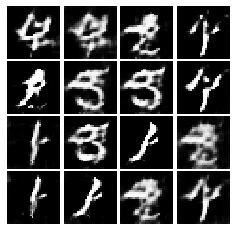

Epoch: 1, Iter: 660, D: 0.7286, G:1.298


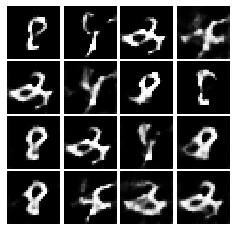

Epoch: 1, Iter: 680, D: 0.5274, G:2.014


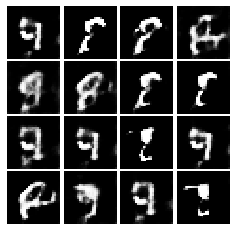

Epoch: 1, Iter: 700, D: 0.2617, G:3.091


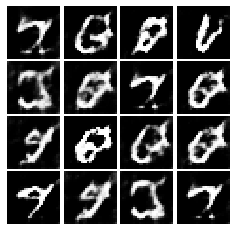

Epoch: 1, Iter: 720, D: 0.4406, G:2.571


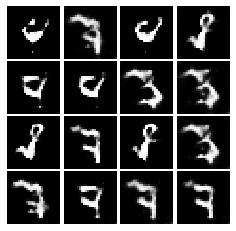

Epoch: 1, Iter: 740, D: 0.6077, G:2.222


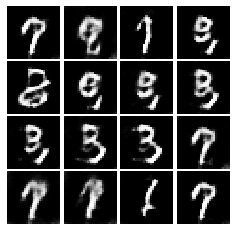

Epoch: 1, Iter: 760, D: 0.4607, G:3.518


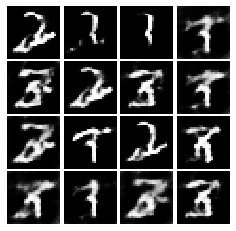

Epoch: 1, Iter: 780, D: 0.4177, G:2.916


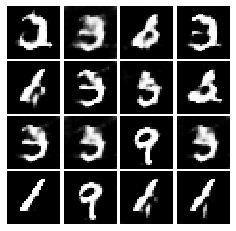

Epoch: 1, Iter: 800, D: 0.8612, G:2.23


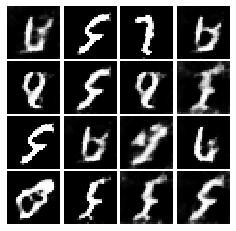

Epoch: 1, Iter: 820, D: 0.4443, G:2.244


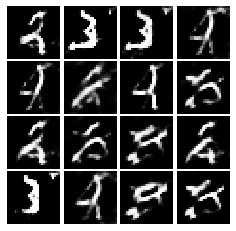

Epoch: 1, Iter: 840, D: 0.6729, G:2.022


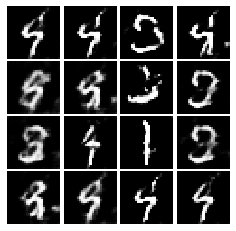

Epoch: 1, Iter: 860, D: 0.741, G:2.074


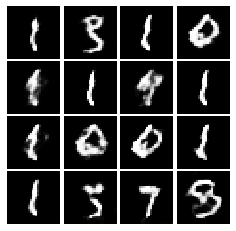

Epoch: 1, Iter: 880, D: 0.4979, G:2.5


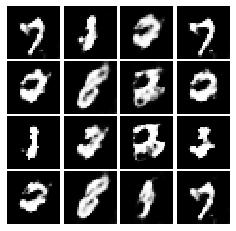

Epoch: 1, Iter: 900, D: 0.5207, G:2.279


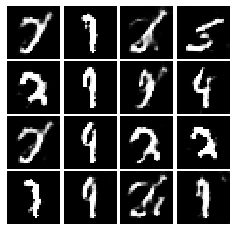

Epoch: 1, Iter: 920, D: 0.4871, G:2.857


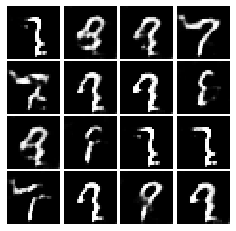

Epoch: 2, Iter: 940, D: 0.3942, G:2.635


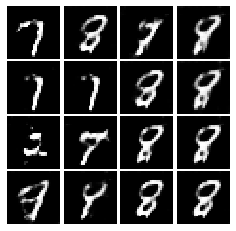

Epoch: 2, Iter: 960, D: 0.5775, G:2.694


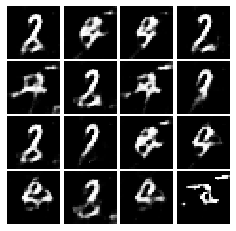

Epoch: 2, Iter: 980, D: 0.8032, G:2.408


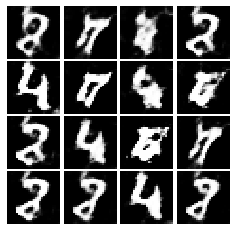

Epoch: 2, Iter: 1000, D: 0.4291, G:2.619


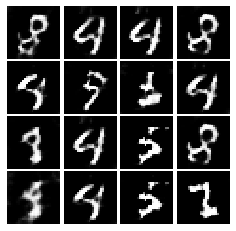

Epoch: 2, Iter: 1020, D: 0.4406, G:2.495


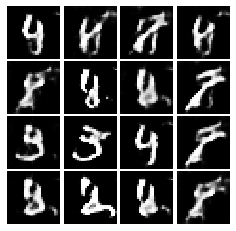

Epoch: 2, Iter: 1040, D: 0.4733, G:2.52


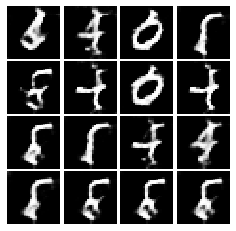

Epoch: 2, Iter: 1060, D: 0.4229, G:2.229


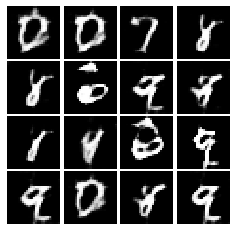

Epoch: 2, Iter: 1080, D: 0.4775, G:2.463


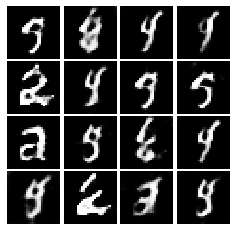

Epoch: 2, Iter: 1100, D: 0.4311, G:3.362


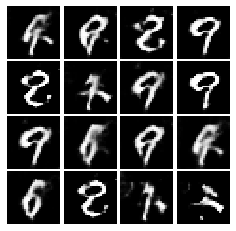

Epoch: 2, Iter: 1120, D: 0.5785, G:2.593


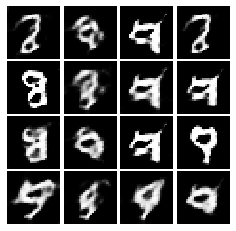

Epoch: 2, Iter: 1140, D: 0.4783, G:2.175


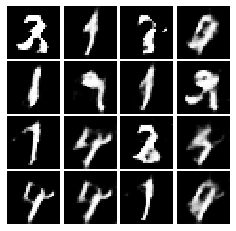

Epoch: 2, Iter: 1160, D: 0.4499, G:2.86


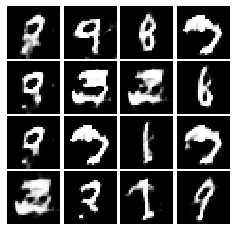

Epoch: 2, Iter: 1180, D: 0.5461, G:3.05


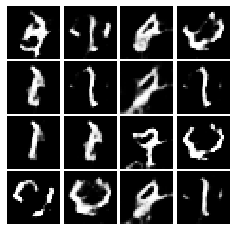

Epoch: 2, Iter: 1200, D: 0.5356, G:2.255


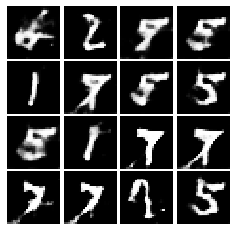

Epoch: 2, Iter: 1220, D: 0.7023, G:2.285


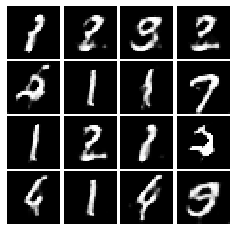

Epoch: 2, Iter: 1240, D: 0.7562, G:2.106


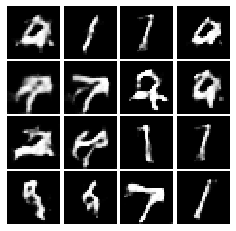

Epoch: 2, Iter: 1260, D: 0.4998, G:1.92


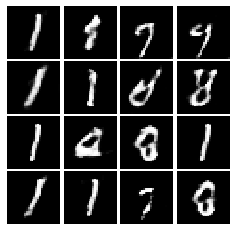

Epoch: 2, Iter: 1280, D: 0.5545, G:2.749


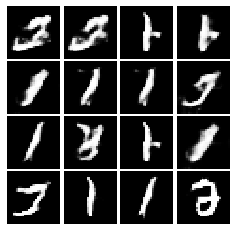

Epoch: 2, Iter: 1300, D: 0.5514, G:2.262


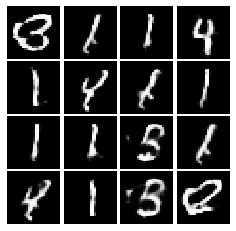

Epoch: 2, Iter: 1320, D: 0.5065, G:2.514


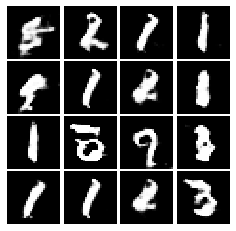

Epoch: 2, Iter: 1340, D: 0.6469, G:2.409


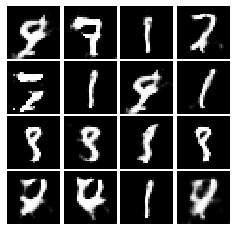

Epoch: 2, Iter: 1360, D: 0.5705, G:1.671


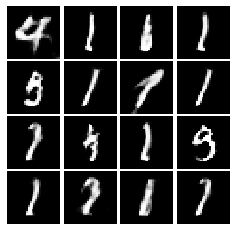

Epoch: 2, Iter: 1380, D: 0.5299, G:2.491


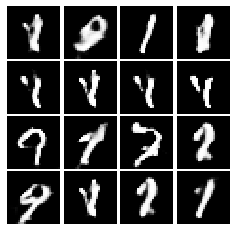

Epoch: 2, Iter: 1400, D: 0.5415, G:2.145


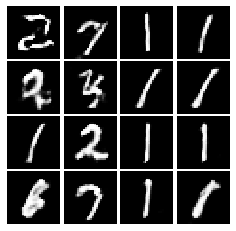

Epoch: 3, Iter: 1420, D: 0.5484, G:1.788


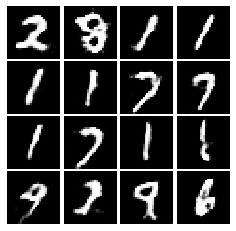

Epoch: 3, Iter: 1440, D: 0.6247, G:2.534


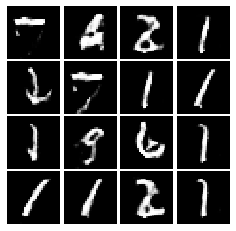

Epoch: 3, Iter: 1460, D: 0.6237, G:1.841


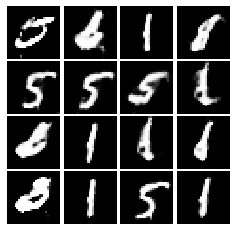

Epoch: 3, Iter: 1480, D: 0.4585, G:2.341


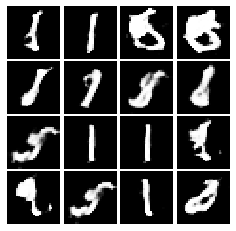

Epoch: 3, Iter: 1500, D: 0.751, G:3.191


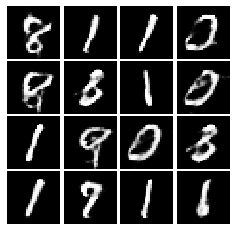

Epoch: 3, Iter: 1520, D: 0.7719, G:2.761


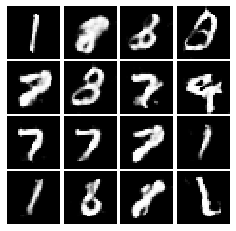

Epoch: 3, Iter: 1540, D: 0.6356, G:1.981


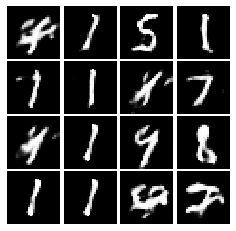

Epoch: 3, Iter: 1560, D: 0.5912, G:1.962


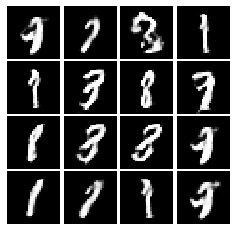

Epoch: 3, Iter: 1580, D: 0.6424, G:1.644


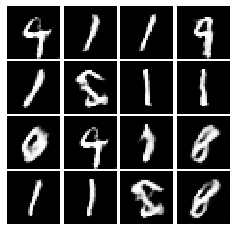

Epoch: 3, Iter: 1600, D: 0.7604, G:2.82


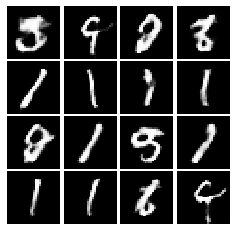

Epoch: 3, Iter: 1620, D: 0.5189, G:1.971


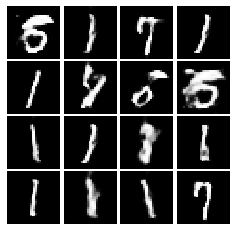

Epoch: 3, Iter: 1640, D: 0.6087, G:2.196


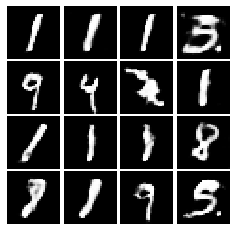

Epoch: 3, Iter: 1660, D: 0.547, G:2.075


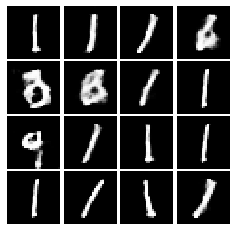

Epoch: 3, Iter: 1680, D: 1.002, G:1.675


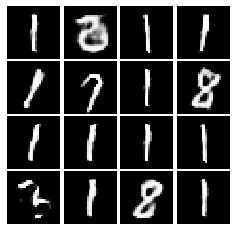

Epoch: 3, Iter: 1700, D: 0.6068, G:1.959


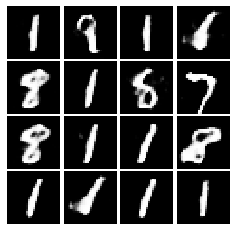

Epoch: 3, Iter: 1720, D: 0.489, G:2.105


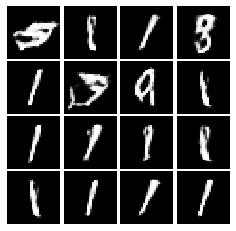

Epoch: 3, Iter: 1740, D: 0.5597, G:1.997


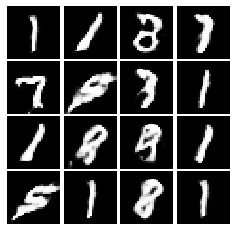

Epoch: 3, Iter: 1760, D: 0.4934, G:2.436


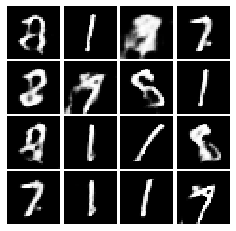

Epoch: 3, Iter: 1780, D: 0.5877, G:2.094


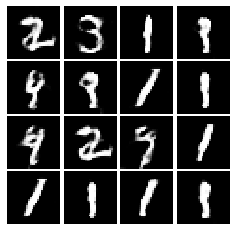

Epoch: 3, Iter: 1800, D: 0.6179, G:1.903


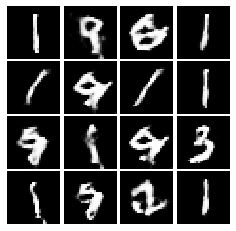

Epoch: 3, Iter: 1820, D: 0.7514, G:1.364


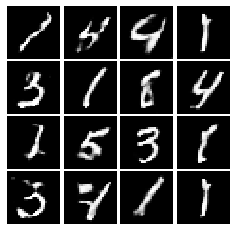

Epoch: 3, Iter: 1840, D: 0.5018, G:1.639


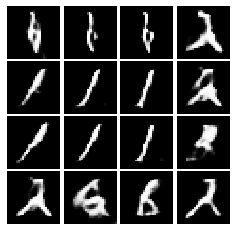

Epoch: 3, Iter: 1860, D: 0.6148, G:1.961


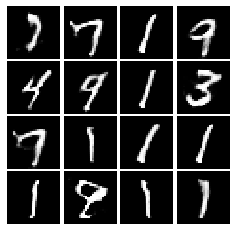

Epoch: 4, Iter: 1880, D: 0.522, G:2.225


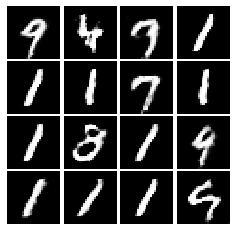

Epoch: 4, Iter: 1900, D: 0.5931, G:2.171


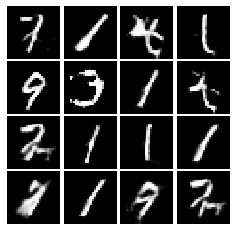

Epoch: 4, Iter: 1920, D: 0.5509, G:2.041


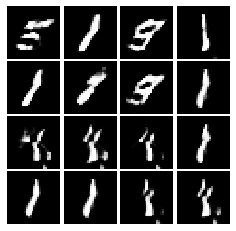

Epoch: 4, Iter: 1940, D: 0.4669, G:2.181


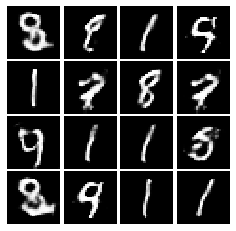

Epoch: 4, Iter: 1960, D: 0.5251, G:2.781


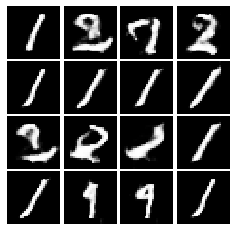

Epoch: 4, Iter: 1980, D: 0.7203, G:1.496


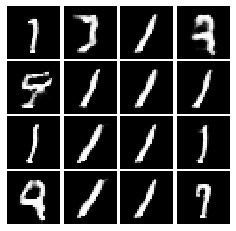

Epoch: 4, Iter: 2000, D: 0.918, G:1.14


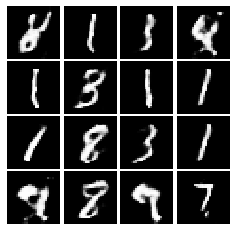

Epoch: 4, Iter: 2020, D: 0.5735, G:1.845


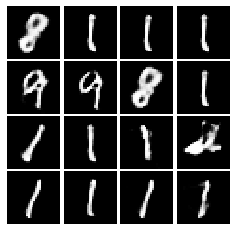

Epoch: 4, Iter: 2040, D: 0.5588, G:1.985


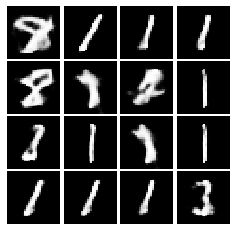

Epoch: 4, Iter: 2060, D: 0.5978, G:2.384


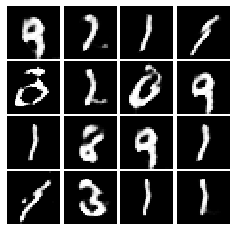

Epoch: 4, Iter: 2080, D: 0.5173, G:2.245


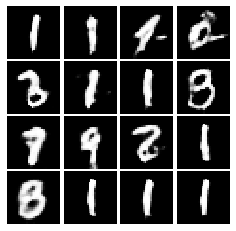

Epoch: 4, Iter: 2100, D: 0.5044, G:1.905


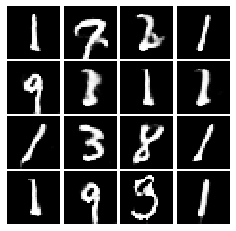

Epoch: 4, Iter: 2120, D: 0.6156, G:1.49


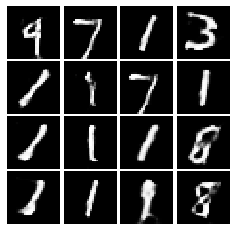

Epoch: 4, Iter: 2140, D: 0.684, G:1.806


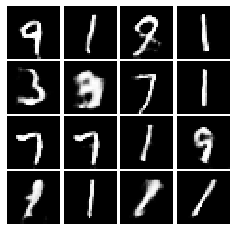

Epoch: 4, Iter: 2160, D: 0.5253, G:2.238


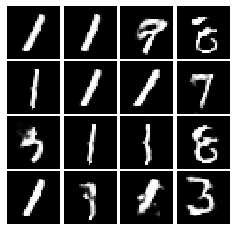

Epoch: 4, Iter: 2180, D: 0.5282, G:2.688


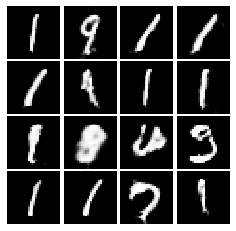

Epoch: 4, Iter: 2200, D: 0.71, G:2.035


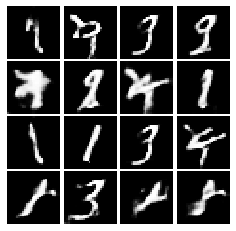

Epoch: 4, Iter: 2220, D: 0.5096, G:3.057


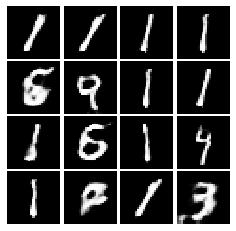

Epoch: 4, Iter: 2240, D: 0.5737, G:2.39


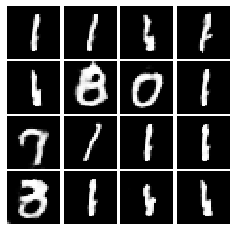

Epoch: 4, Iter: 2260, D: 0.4541, G:2.425


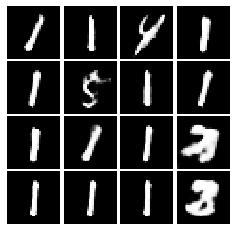

Epoch: 4, Iter: 2280, D: 0.5411, G:2.576


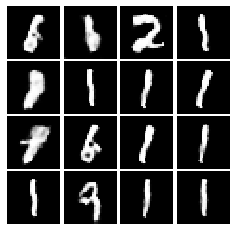

Epoch: 4, Iter: 2300, D: 0.567, G:1.715


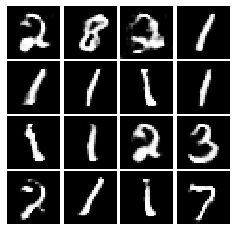

Epoch: 4, Iter: 2320, D: 0.4455, G:2.455


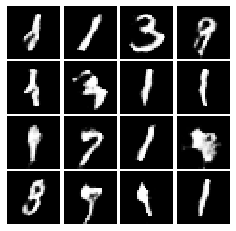

Epoch: 4, Iter: 2340, D: 0.6066, G:2.253


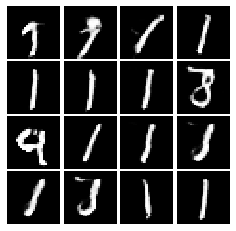

Final images


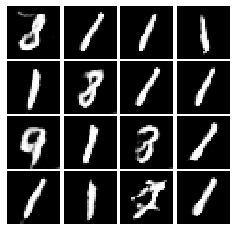

In [31]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ | $y_7$ | $y_8$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |  1    |  -1   |  -2   |  -1   |  1    |  2    |  1       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ | $x_7$ | $x_8$ 
   1   |   -1  | -2    |  -1   |  1    |  2    |  1    |  -1   |  -2   
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
No we would not reach the optimal value as xy updates are caught in a loop after some number of steps


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
